# Exploratory Data Analysis on Prediction interval competition I: Birth weight (1)


Welcome to this exploration where we delve deep into the heart of our datasets to understand and learn the data. In this notebook, our journey is twofold: 
 - firstly, to conduct a detailed exploratory analysis that sheds light on the intricate dynamics of our variables, 
 - and secondly, to lay a groundwork for feature engineering. 
 
Using [Data](https://www.kaggle.com/competitions/prediction-interval-competition-i-birth-weight/data) and [UserGuide](https://ftp.cdc.gov/pub/Health_Statistics/NCHS/Dataset_Documentation/DVS/natality/UserGuide2018-508.pdf), we aim not only to understand variables, the relationships and patterns that lie beneath the surface but also to harness this knowledge to enhance our predictive modeling efforts.

Through visualizations, statistical analysis, and thoughtful interpretation, we will uncover the story our data tell - focusing on outliers for interval predictions, setting the stage for innovative feature engineering that could revolutionize our approach to the challenges ahead. 

**It is important to note that this notebook focuses on understanding the data deeply to inform feature engineering decisions. The actual process of feature engineering will be explored in a subsequent notebook.** This separation ensures a thorough and focused analysis here, providing a solid foundation for the creative and technical processes of feature engineering to follow.


## Introduction

The notebook is split into the below sessions, each designed to progressively explore and analyze the dataset in depth:

- **Install - Import libraries**
    - This section covers the installation and importing of Python libraries required for our analysis.
- **Set up Parameters**
    - Here, we set up various parameters that will be used throughout the notebook, such as file paths and specific configuration settings.
- **Import data**
    - This part involves loading the dataset into the notebook for analysis.
- **Exploratory Data Analysis (EDA)**
    - **Summary Statistics**: Quick overview of the dataset's statistical properties.
    - **Missing Values**: Identification and handling of missing data within the dataset.
    - **Comparative Analysis**: Comparing different subsets of data (train/test) to observe potential patterns or anomalies.
    - **In-Depth Exploration**: A closer look at specific areas of interest within the train dataset.
    - **Analyzing Variable Distributions: A Visual Approach**: Using visualizations to explore the distributions of various variables.

# Install - Import libraries

In [1]:
!pip install git+https://github.com/KyriakosJiannis/python_modules.git@main

  Cloning https://github.com/KyriakosJiannis/python_modules.git (to revision main) to /tmp/pip-req-build-4hrv5o7e
  Running command git clone --filter=blob:none --quiet https://github.com/KyriakosJiannis/python_modules.git /tmp/pip-req-build-4hrv5o7e
  Resolved https://github.com/KyriakosJiannis/python_modules.git to commit 38ec68562595fad5c6ac4b638b1ec53945a2c788
  Preparing metadata (setup.py) ... done
  Created wheel for python_modules: filename=python_modules-0.0.2-py3-none-any.whl size=11874 sha256=2a5e74b9a44a58b48937782b619fc992c6beeac4f715a0110244aeab724f75e3
  Stored in directory: /tmp/pip-ephem-wheel-cache-7jb_dfdr/wheels/ba/0d/0a/e7561e4d94e77e6134ab8356755b8572818ff9a5362bfea01a
Successfully built python_modules


In [2]:
!pip install sweetviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 57.9 MB/s eta 0:00:00


In [3]:
import socket
import sys
import sweetviz as sv
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from IPython.display import display, HTML, IFrame
from python_modules.eda_charts import  descriptive_dataframe, dual_line_bar_boxplot   # custom functions      
import warnings

warnings.filterwarnings('ignore')

# Set up Parameters

In [4]:
Computer_Name = socket.gethostname()
print('Computer Name:' +  socket.gethostname())
print('Python Version:' + sys.version)

Computer Name:6c793bbf4ef5
Python Version:3.10.13 | packaged by conda-forge | (main, Dec 23 2023, 15:36:39) [GCC 12.3.0]


In [5]:
# Set up the paths for local and kaggle
if Computer_Name in ['MSI', 'HOME']:
    # Paths for local environment
    train_path = 'https://filedn.com/lK8J7mCaIwsQFcheqaDLG5z/data/Kaggle-interval-birth/train.csv'
    test_path = 'https://filedn.com/lK8J7mCaIwsQFcheqaDLG5z/data/Kaggle-interval-birth/test.csv'
    submission_path = './input/sample_submission.csv'
    environment = 'local' 
else:
    # Paths for local environment
    train_path = '/kaggle/input/prediction-interval-competition-i-birth-weight/train.csv'
    test_path = '/kaggle/input/prediction-interval-competition-i-birth-weight/test.csv'
    submission_path = '/kaggle/input/prediction-interval-competition-i-birth-weight/sample_submission.csv'
    environment = 'Kaggle'  
    
print(environment)

Kaggle


# Import data

In [6]:
train = pd.read_csv(train_path, index_col="id")
test = pd.read_csv(test_path, index_col="id")
submission = pd.read_csv(submission_path, index_col="id")

# Exploratory Data Analysis (EDA)

In the heart of notebook, designed to unravel the intricacies and hidden patterns within our dataset. For this we employ Sweetviz, an innovative tool that enhances our exploration with its comprehensive and intuitive visualizations. Our EDA is methodically segmented into phases, each tailored to illuminate different facets of our data learning:

- **Summary Statistics:** We initiate our analysis with view of the dataset, gauging its statistical backbone to understand the distribution, central tendencies, and variability of our variables.

- **Missing Values:** Recognizing the importance of data integrity, we identify and address the absence of data, ensuring our dataset's completeness and reliability for subsequent analysis.

- **Comparative Analysis:** Diving deeper, using SweetViz, we conduct a comparative examination of our training and test datasets. This step, though not mandatory, is important for assessing sample homogeneity—confirming that both datasets reflect comparable characteristics.

- **In-Depth Exploration:** Our exploration then narrows to the essence of the training set, dissecting its distributions and correlations using SweetViz. This phase is aimed at decrypting the complex interplay between variables, uncovering valuable patterns and insights that lay the groundwork for effective feature engineering.

- **Analyzing Variable Distributions:** A Visual Approach: Leveraging the visual process for each feature employing a range of graphical representations to bring the data's story to life, highlighting trends, outliers, and underlying structures important understand deeper the distributions for interval predictions.

This meticulously EDA session is aim to lay a solid foundation for innovative feature engineering, informed by the rich insights gleaned from this exploration.

### Summary Statistics Overview


**Birth Weight (DBWT) Analysis**
- **Skewness and Central Tendency**: The `DBWT` variable, representing Birth Weight, exhibits a left skew with a mean of 3260 and a median of 3300. This indicates a central tendency towards the higher end of the weight spectrum A more detailed analysis of this distribution will be conducted subsequently to understand its implications further.

**Missing Values and Special Codes**
- **Coding for Missing Values**: Across the dataset, missing values have been encoded with special values, including 99, 99.9, 9, 8, 88, 999, 9999, and 888, as well as blank spaces (' ') for DMAR. In medical datasets, such 'missing values' are often due to data not being recorded or not applicable to the patient. These cases constitute a significant proportion of the dataset and will require specific strategies to handle, as they can influence model performance.
- **High Missing Value Rates**: For variables `ILLB_R`, `ILOP_R`, and `ILP_R`, more than 40% of the records are missing, with `ILOP_R` notably having up to 80% missing. Other variables such as `DMAR`, `FAGECOMB`, and `FEDUC` exhibit missing rates greater than 10%, while a few have less than 10% missing values.

**Observations on Skewness and Category Frequencies**
- **Skewed Variables and Category Dominance**: A preliminary observation across many variables indicates a presence of significant skewness and a dominance of certain categories, which manifests as a high frequency of observations in one category. These characteristics warrant further investigation to ensure appropriate treatments in the analysis and feature engineering stages.

#### Train

In [7]:
print( f"\n\n Data Shape: {train.shape}  \n\n Data columns : {train.columns}")



 Data Shape: (108082, 37)  

 Data columns : Index(['ATTEND', 'BFACIL', 'BMI', 'CIG_0', 'DLMP_MM', 'DMAR', 'DOB_MM',
       'DOB_TT', 'DOB_WK', 'FAGECOMB', 'FEDUC', 'ILLB_R', 'ILOP_R', 'ILP_R',
       'LD_INDL', 'MAGER', 'MBSTATE_REC', 'MEDUC', 'M_Ht_In', 'NO_INFEC',
       'NO_MMORB', 'NO_RISKS', 'PAY', 'PAY_REC', 'PRECARE', 'PREVIS',
       'PRIORDEAD', 'PRIORLIVE', 'PRIORTERM', 'PWgt_R', 'RDMETH_REC',
       'RESTATUS', 'RF_CESAR', 'RF_CESARN', 'SEX', 'WTGAIN', 'DBWT'],
      dtype='object')


In [8]:
display(HTML(train.head(10).to_html()))

,ATTEND,BFACIL,BMI,CIG_0,DLMP_MM,DMAR,DOB_MM,DOB_TT,DOB_WK,FAGECOMB,FEDUC,ILLB_R,ILOP_R,ILP_R,LD_INDL,MAGER,MBSTATE_REC,MEDUC,M_Ht_In,NO_INFEC,NO_MMORB,NO_RISKS,PAY,PAY_REC,PRECARE,PREVIS,PRIORDEAD,PRIORLIVE,PRIORTERM,PWgt_R,RDMETH_REC,RESTATUS,RF_CESAR,RF_CESARN,SEX,WTGAIN,DBWT
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1,1,18.5,0,12,,10,1434,5,99,9,888,888,888,N,34,1,3,64,1,1,0,2,2,2,12,0,0,0,108,1,1,N,0,F,24,2800
1,1,1,18.3,2,4,1,12,2156,6,39,6,83,999,999,N,41,1,3,62,1,1,1,2,2,99,99,0,2,1,100,1,1,N,0,M,18,1900
2,1,1,27.3,0,3,2,12,1241,2,31,4,107,999,999,N,41,1,3,59,1,1,0,1,1,7,6,0,2,2,135,4,1,Y,2,F,27,2960
3,1,1,24.0,0,7,2,4,1649,2,99,9,888,888,888,Y,24,2,3,57,1,1,1,1,1,4,17,0,0,0,111,3,1,N,0,M,29,3657
4,2,1,23.6,0,6,1,3,752,2,31,3,55,888,55,N,29,1,5,60,1,1,0,1,1,4,9,0,2,0,121,4,1,Y,2,F,37,3742
5,2,1,99.9,0,12,1,9,2050,7,20,3,115,888,115,N,32,2,4,64,1,1,1,1,1,2,13,0,1,0,999,1,1,N,0,F,99,3317
6,1,1,29.8,0,99,1,7,1358,6,39,6,888,888,888,N,37,1,6,67,1,1,0,2,2,3,16,0,0,0,190,3,1,N,0,M,27,3550
7,1,1,25.1,0,3,2,9,2059,6,32,4,888,999,999,N,30,2,5,62,1,1,1,1,1,5,10,0,0,1,137,1,2,N,0,M,7,515
8,2,1,38.7,2,8,1,4,1833,3,26,3,888,20,20,Y,26,1,3,67,1,1,0,1,1,3,12,0,0,1,247,1,1,N,0,F,0,2438


In [9]:
display(HTML(train.tail(10).to_html()))

,ATTEND,BFACIL,BMI,CIG_0,DLMP_MM,DMAR,DOB_MM,DOB_TT,DOB_WK,FAGECOMB,FEDUC,ILLB_R,ILOP_R,ILP_R,LD_INDL,MAGER,MBSTATE_REC,MEDUC,M_Ht_In,NO_INFEC,NO_MMORB,NO_RISKS,PAY,PAY_REC,PRECARE,PREVIS,PRIORDEAD,PRIORLIVE,PRIORTERM,PWgt_R,RDMETH_REC,RESTATUS,RF_CESAR,RF_CESARN,SEX,WTGAIN,DBWT
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
108072,2,1,21.3,0,5,2,1,318,2,99,9,50,888,50,N,31,1,2,64,1,1,0,1,1,2,9,0,3,0,124,1,1,N,0,M,20,2390
108073,1,1,22.6,0,5,1,2,1007,7,32,4,888,888,888,N,29,1,6,58,1,1,1,2,2,1,10,0,0,0,108,1,2,N,0,F,24,3240
108074,3,1,18.9,0,2,2,11,1459,5,28,4,888,888,888,N,23,1,3,67,1,1,0,2,2,3,12,0,0,0,121,1,2,N,0,M,34,3355
108075,1,1,39.3,0,2,1,11,938,2,31,4,999,888,999,N,29,1,4,65,1,1,1,2,2,3,9,0,2,0,236,1,2,N,0,F,30,3386
108076,1,1,25.1,0,12,2,9,544,4,40,5,888,888,888,Y,31,1,4,67,1,1,1,2,2,2,11,0,0,0,160,1,2,N,0,M,42,3203
108077,1,1,35.2,0,9,1,6,1555,4,31,5,33,888,33,N,30,2,4,64,1,1,0,2,2,4,7,0,1,0,205,4,1,Y,1,M,23,3317
108078,1,1,35.7,0,8,1,5,41,1,25,4,888,888,888,N,22,1,4,66,1,1,1,2,2,3,14,0,0,0,221,1,1,N,0,F,21,2920
108079,1,1,28.3,0,5,1,2,1331,6,36,6,38,888,38,Y,31,1,7,65,1,1,1,2,2,3,13,0,1,0,170,1,1,N,0,M,22,3700
108080,1,1,38.3,0,12,2,9,2034,6,25,3,27,888,27,N,22,1,4,65,1,1,1,2,2,0,0,0,1,0,230,1,2,N,0,M,0,4180


In [10]:
def count_true_missing_values(input_data, columns_to_count, special_codes): 
    """returns dataframe mapping counts for scecial code"""
    inp = input_data.copy()
    code_counts_df = pd.DataFrame({f'Count_{code}': inp[columns_to_count].isin([code]).sum() for code in special_codes})
    code_counts_df['Missing Counts'] =  code_counts_df.sum(axis=1, numeric_only=True)
    return code_counts_df

In [11]:
columns_1 = ['ATTEND', 'BFACIL', 'BMI', 'DMAR', 'NO_INFEC', 'NO_MMORB', 'PAY_REC']
special_codes_1 = [99, 99.9, 9, 8, 88, 999, 9999, 888, ' ']

columns_2 = ['CIG_0', 'DLMP_MM', 'FAGECOMB', 'M_Ht_In', 'PRECARE', 'PREVIS', 'PRIORDEAD', 'PRIORLIVE', 'PRIORTERM',  'RF_CESARN', 'WTGAIN']
special_codes_2 = [99]

columns_3 = ['DOB_TT']
special_codes_3 = [9999]

columns_4 = ['FEDUC', 'MEDUC', 'PAY']
special_codes_4 = [9]

columns_5 = ['ILLB_R', 'ILOP_R', 'ILP_R', 'PWgt_R']
special_codes_5 = [999, 888]

# Aggregate Missing Counts
special_code_counts = pd.concat([
    count_true_missing_values(train, columns_1, special_codes_1)['Missing Counts'],
    count_true_missing_values(train, columns_2, special_codes_2)['Missing Counts'],
    count_true_missing_values(train, columns_3, special_codes_3)['Missing Counts'],
    count_true_missing_values(train, columns_4, special_codes_4)['Missing Counts'],
    count_true_missing_values(train, columns_5, special_codes_5)['Missing Counts']
])

In [12]:
descriptive_df = descriptive_dataframe(train)
descriptive_df =  pd.merge(descriptive_df,special_code_counts, how='left', right_index=True, left_index=True)
descriptive_df['Missing Counts'] = descriptive_df['Missing Counts'].fillna(0)

In [13]:
display(HTML(descriptive_df.to_html()))

,Dtype,Count,NaN Count,Unique,Top,Freq,mean,std,min,5%,25%,50%,75%,95%,max,Range,Kurtosis,Skew,Missing Counts
ATTEND,int64,108082,0,6,1,87407,1.330,0.766,1.0,1.0,1.0,1.0,1.0,3.0,9.0,8.0,9.991,2.742,56.0
BFACIL,int64,108082,0,8,1,106342,1.034,0.311,1.0,1.0,1.0,1.0,1.0,1.0,9.0,8.0,191.033,12.350,11.0
BMI,float64,108082,0,498,99.9,2454,28.848,12.732,13.2,19.0,22.3,25.8,31.2,43.5,99.9,86.7,19.334,4.010,2454.0
CIG_0,int64,108082,0,40,0,98633,1.557,8.217,0.0,0.0,0.0,0.0,0.0,10.0,99.0,99.0,99.490,9.190,516.0
DLMP_MM,int64,108082,0,13,12,9377,10.949,19.837,1.0,1.0,4.0,7.0,10.0,12.0,99.0,98.0,15.239,4.077,5075.0
DMAR,object,108082,0,3,1,56906,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13262.0
DOB_MM,int64,108082,0,12,8,9783,6.571,3.421,1.0,1.0,4.0,7.0,10.0,12.0,12.0,11.0,-1.185,-0.038,0.0
DOB_TT,int64,108082,0,1441,805,165,1233.242,632.722,0.0,138.0,801.0,1238.0,1735.0,2234.0,9999.0,9999.0,-0.252,-0.051,2.0
DOB_WK,int64,108082,0,7,6,17385,4.055,1.855,1.0,1.0,2.0,4.0,6.0,7.0,7.0,6.0,-1.130,-0.023,0.0
FAGECOMB,int64,108082,0,63,99,12573,39.630,22.472,14.0,22.0,28.0,33.0,38.0,99.0,99.0,85.0,2.749,2.037,12573.0


### Missing Values

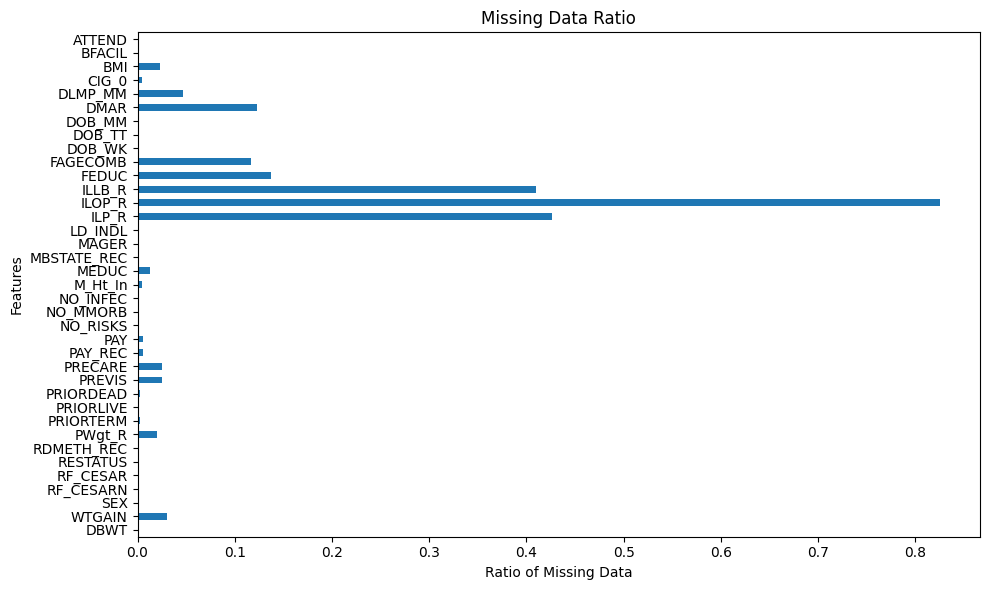

In [14]:
# Plot the Missing Value ratio as a horizontal bar-chart
ax = (descriptive_df['Missing Counts'] / descriptive_df['Count']).plot(kind='barh', figsize=(10, 6))
ax.set_title('Missing Data Ratio')
ax.set_ylabel('Features')
ax.set_xlabel('Ratio of Missing Data')
ax.invert_yaxis()
plt.tight_layout()
plt.show()

### Comparative Analysis

In this session, i compare distributions of the training and testing datasets, uncovering insights to take into account in feature engineering and modeling approaches:

- **Consistency Across Distributions and Correlations**: Our examination proove a remarkable consistency in the distributions and correlations of variables across the training and testing datasets. This consistency underpins our expectation that models trained on the training dataset are well-positioned to generalize effectively to the testing dataset.

- **Divergence in Value Ranges**: Despite overarching similarities, divergences in the ranges of values are notived. Particularly concerning higher-value categories with lower frequencies in the training dataset (akin to outliers), which few absent in the test dataset. The test dataset keen to record in few features a narrower scope of categories or values, suggesting a more condensed data distribution compared to the training dataset. This discrepancy however can have minimal impact on model performance. To navigate this, consideration in Domain-Informed Aggregation and cautious Feature Encoding are advisable. From a modeling perspective, favoring simpler models, implementing regularization techniques, employing ensemble methods, and conducting thorough cross-validation are recommended strategies to enhance model robustness and generalizability. Based on the fact that we want  90% Confidence Interval prediction would need a bit further investigation on this matter.

Detailed Observations:

- **Missing Categories in Specific Variables**: Our analysis identifies a lack of certain categories in the testing dataset that are present in the training dataset, indicating potential areas for attentive feature engineering:
    - Variables `BFACIL` and `RDMETH_REC` are missing the category `9`.
    - Variable `PAY` is missing the category `4`.

- **Underrepresentation of Higher Values**: The testing dataset shows a notable underrepresentation of categories associated with higher values in several variables (e.g., `BMI`, `PREVIS`, `PRIORDEAD`, among others). Despite this underrepresentation, the overall distributions between the datasets remain strikingly similar,

                                             |          | [  0%]   00:00 -> (? left)


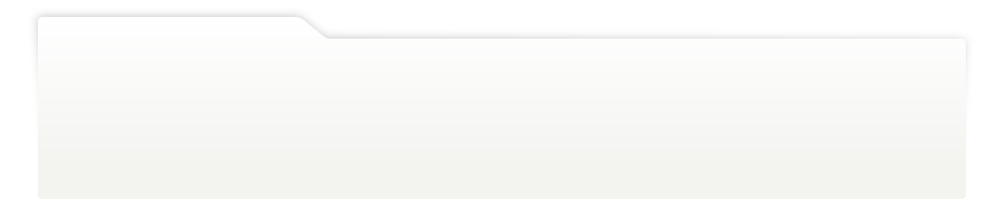
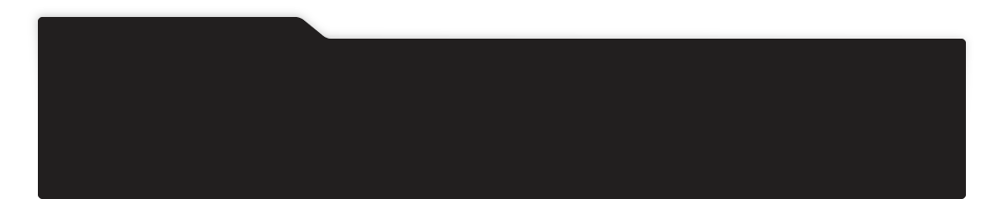
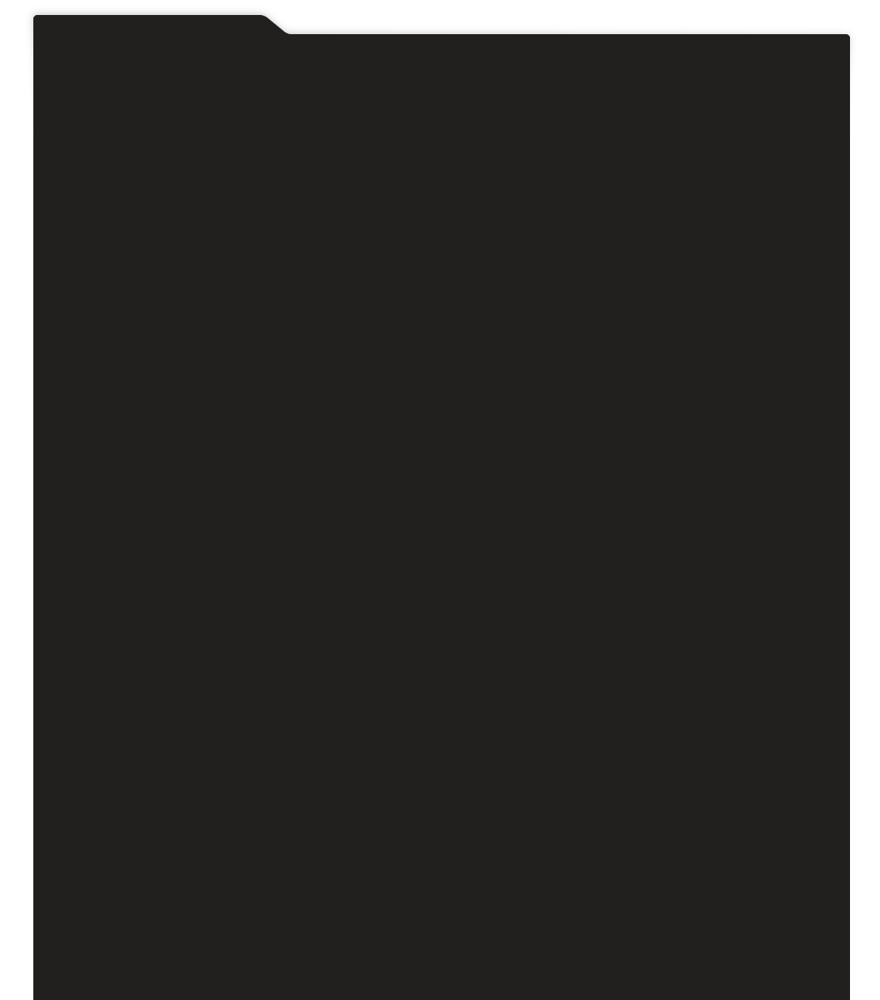
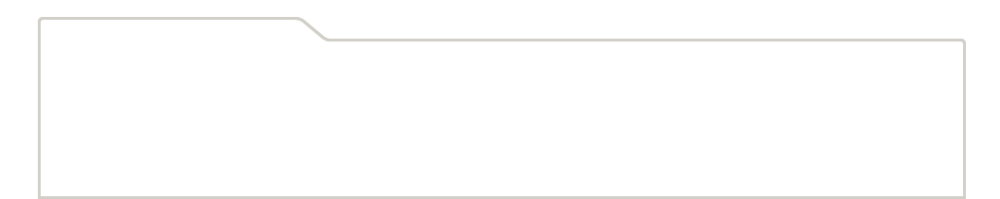
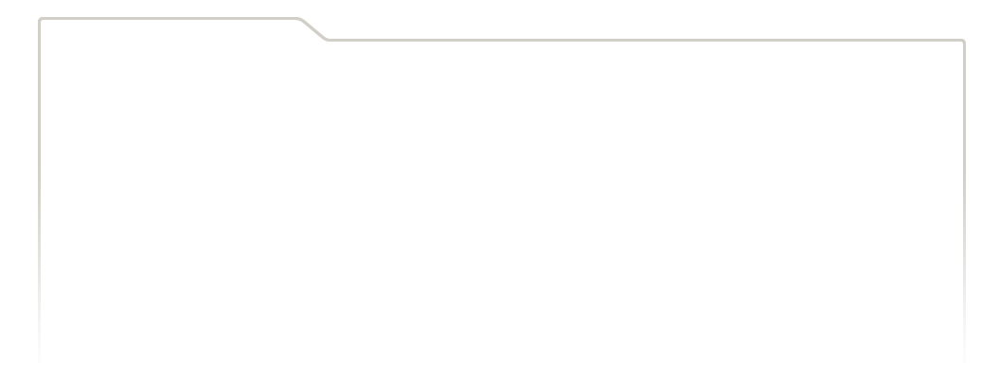
...
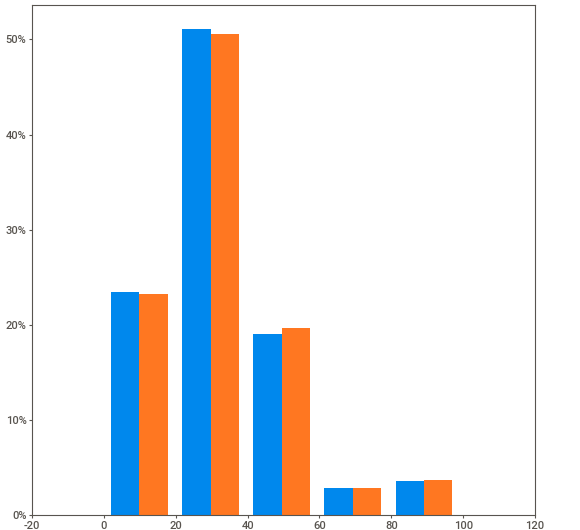
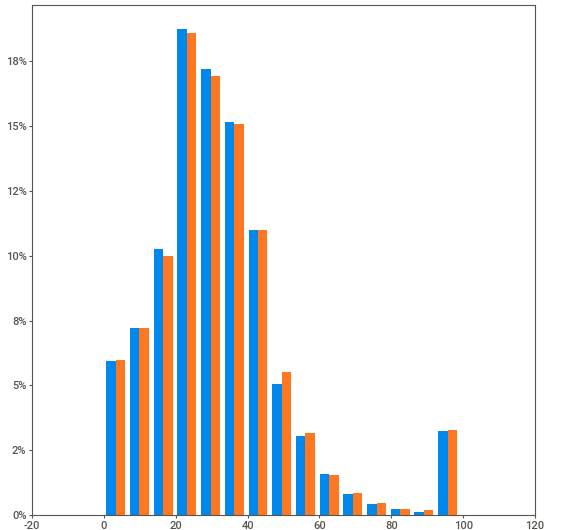
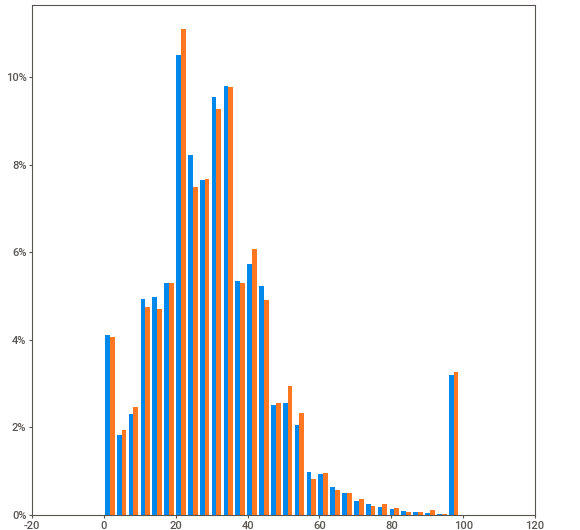
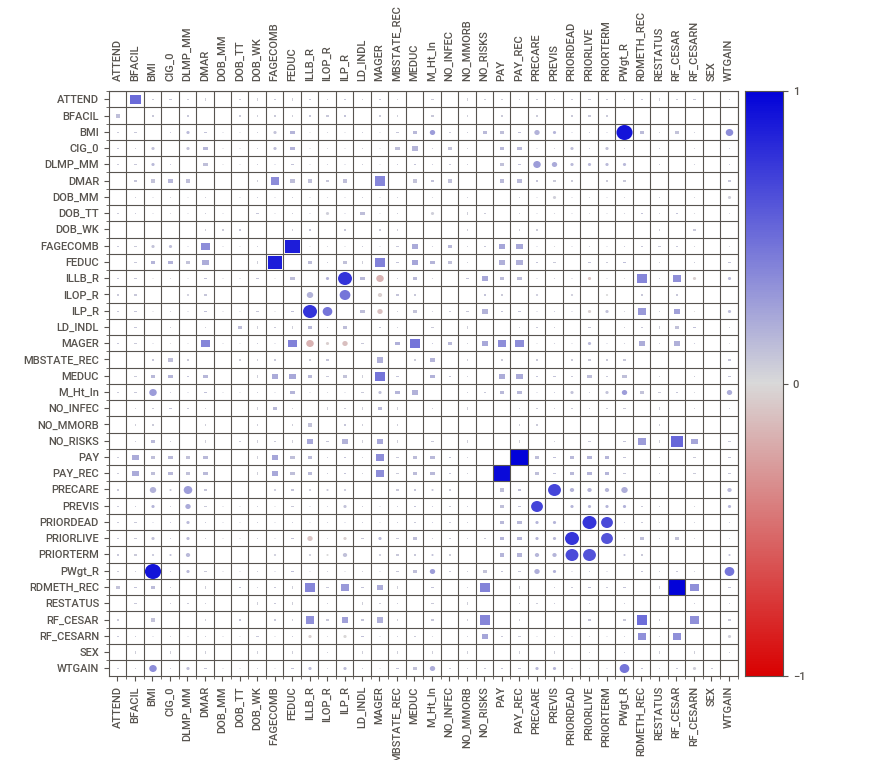
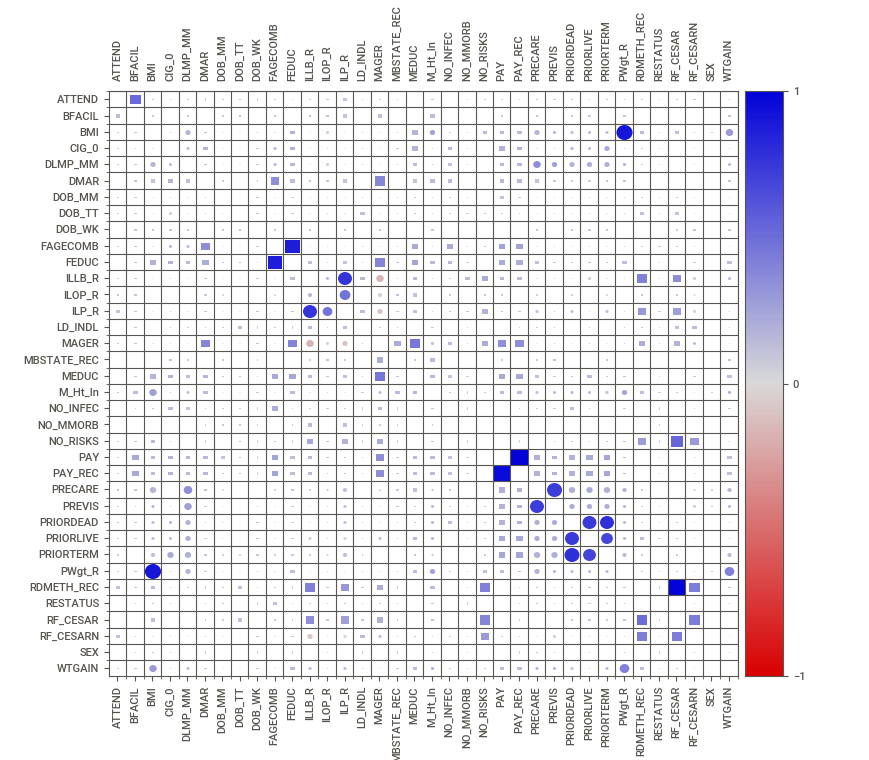

In [15]:
compare_report = sv.compare([train.drop('DBWT',axis = 1),'train'],[test,'test']) 
    
if environment == 'Kaggle':
    compare_report.show_notebook(w="100%", h="full")
else:
    compare_report.show_html('./output/Compare_Results.html')

### In-Depth Exploration

**DBWT Analysis**
- **Central Tendency and Dispersion**: The distribution of `DBWT` (Birth Weight) shows a left skew, with a mean of 3260 and a median of 3300 which indicates a central tendency towards the higher end of the weight spectrum.
- **Quantile Insights**: The 5th percentile (Q5%) is at 2270, indicating the lower tail, while the 95th percentile (Q95%) extends to 4115, showcasing the upper tail's behavior. The standard deviation stands at 590, highlighting this variability within the dataset.
- **Correlations**: We noticed mainly non linear corelations with `WTGAIN`, `M_Ht_In`, `FEDUC`, `DMAR` as important factors and lot voliatility recorded in many low frenquency levels and outliers eg `ATTEND (4)`, `BFACIL(9)`, `BMI(99-not reported`, `FEDUC` to take into consideration as interval predictions. 

**Variable Comparisons**
- **Highly Correlated Variables**: Certain variable pairs such as `FAGECOMB`-`FEBUK`, `PAY`-`PAY_REC`, `RDMETH_REC`-`RF_CESAR`, and `BMI`-`PWgt_R` demonstrate almost identical distributions. Similarly, `PRECARE`-`PREVIS` and `ILP_R`-`ILLB_R`, along with `PRIORDEAD`-`PRIORLIVE`, contain nearly the same information.
- **Feature Engineering Considerations**: Given the redundancy in the information provided by these variables, we will strategically select a subset for inclusion in our feature engineering process to optimize model performance.

**Frequency Distribution and Missing Values**
- **Class Imbalance**: Many variables exhibit a high frequency in certain classes contrasted with extreme lows in others, which may not contribute significantly to predictive power and we will consider to exclude them. In plan is to aggregate some segments and some variables not to use. The next session will drive us further.
- **Handling Missing Values**: Notably, missing values are recorded with distinct in few cases. As part of our modeling strategy, especially with ensemble tree algorithms in mind, we will treat these as missing values to allow the models to capture this aspect effectively.

**Further Visual Analysis**
- To gain a deeper understanding of the distribution tails and further explore the data's nuances, we will proceed with a more visual analysis approach. This step will help us better understand the behavior of `DBWT` across its distribution and inform our feature engineering and modeling decisions.

This detailed exploration forms the foundation of our feature engineering strategy, emphasizing the importance of understanding variable relationships, distribution characteristics, and the impact of missing values on our modeling approach.

                                             |          | [  0%]   00:00 -> (? left)


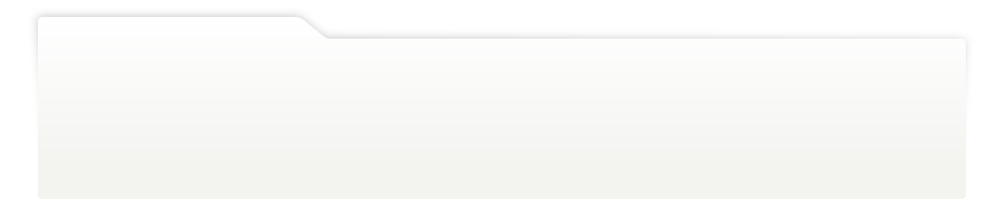
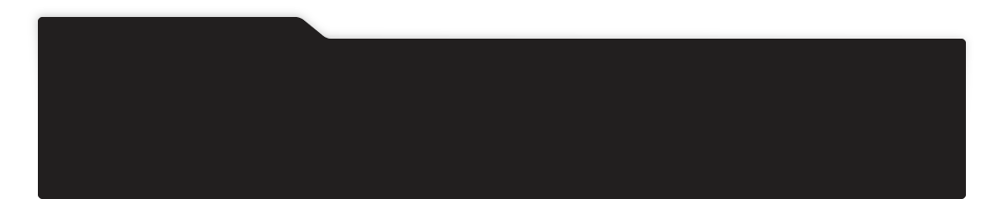
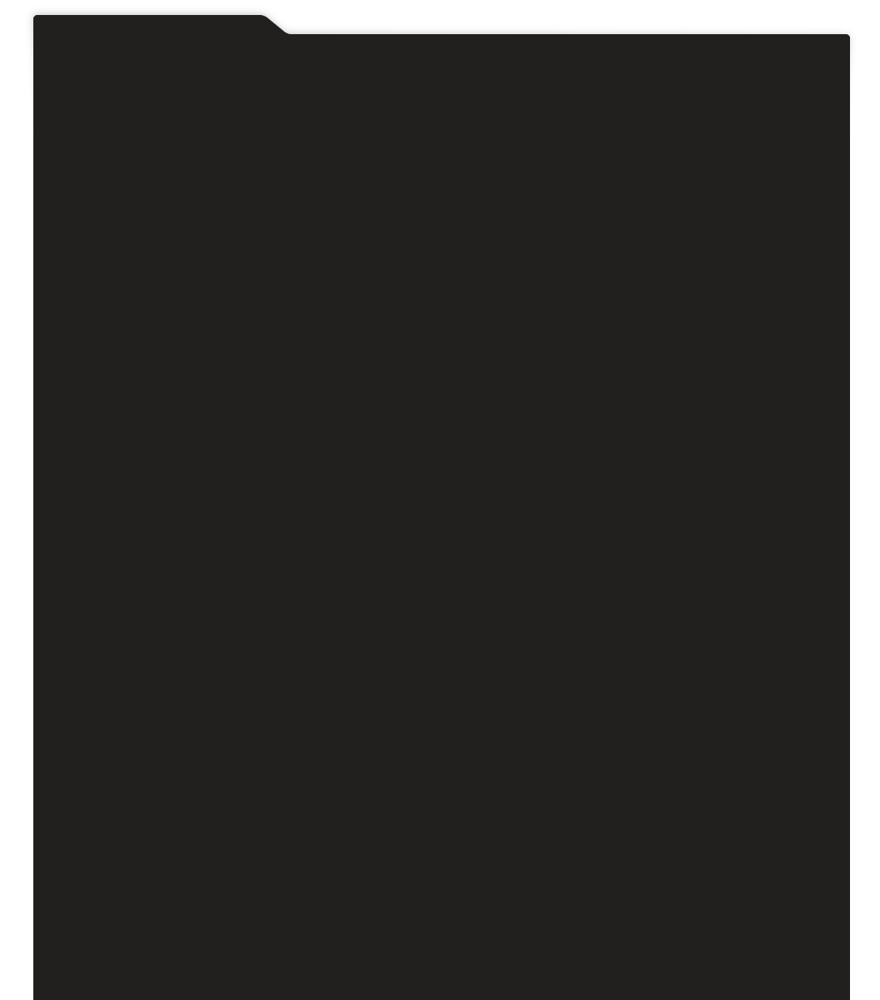
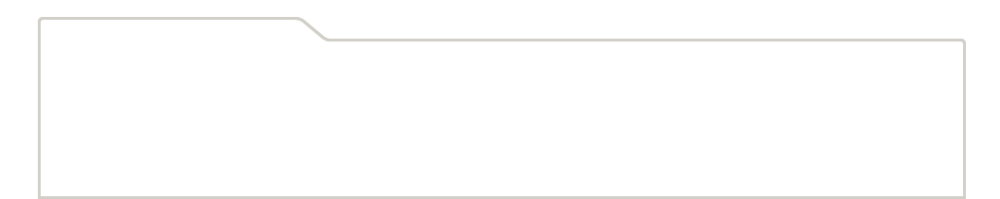
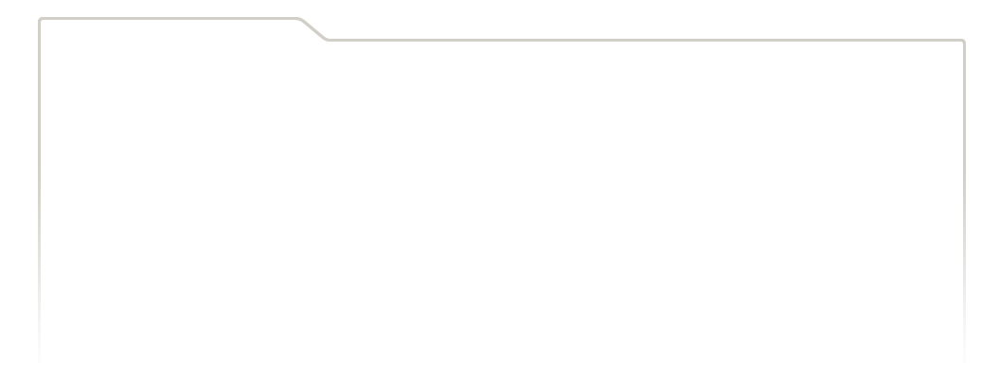
...
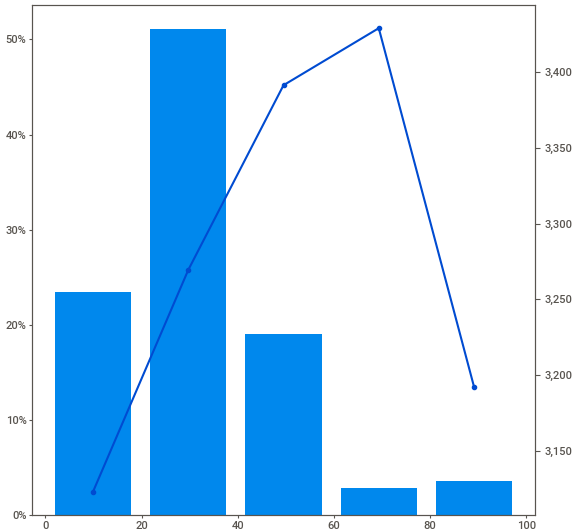
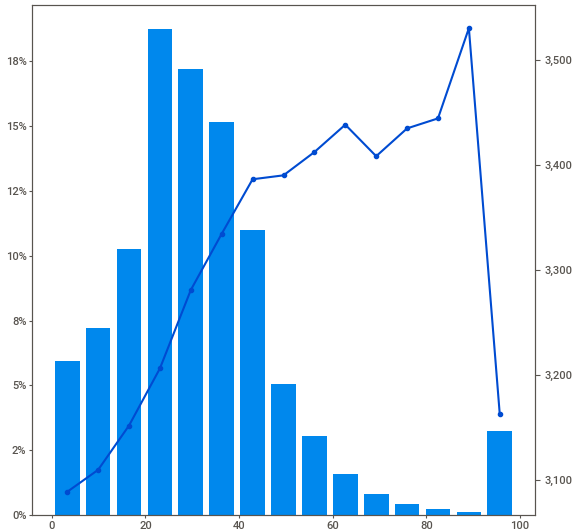
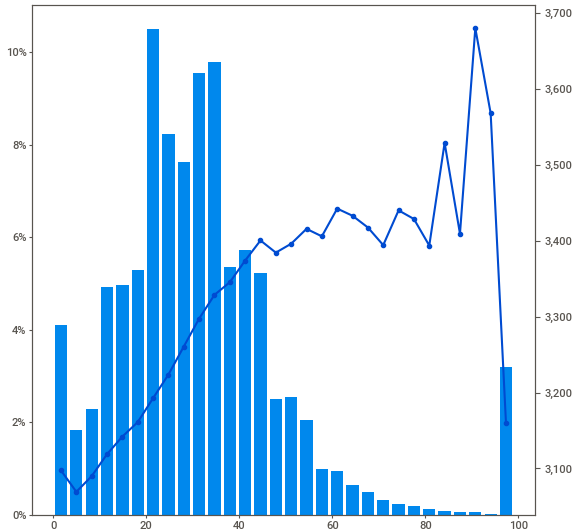
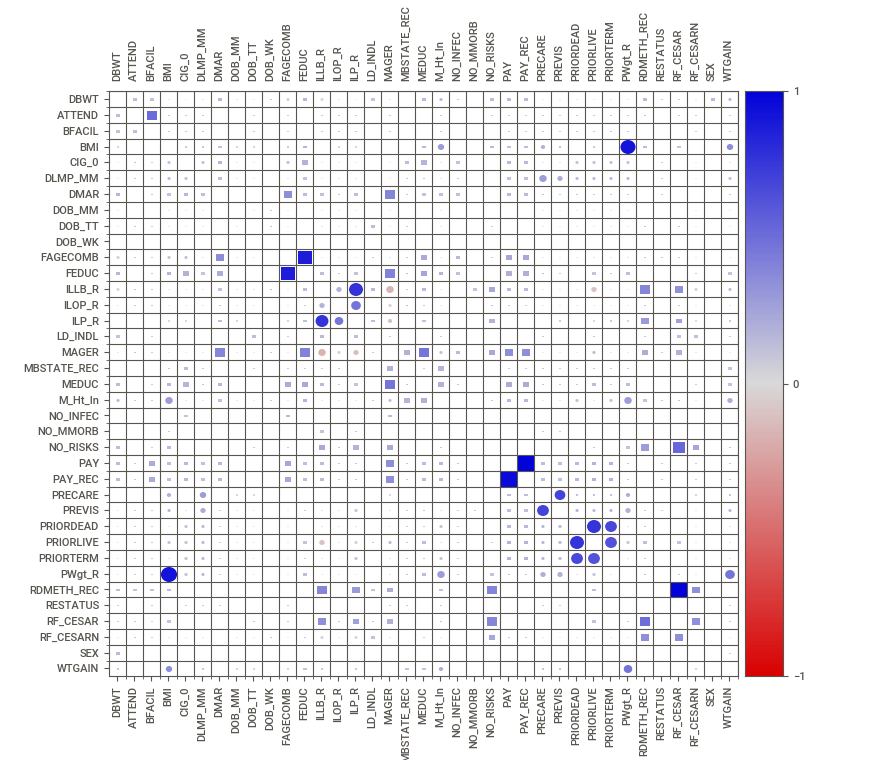
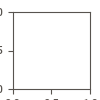

In [16]:
train_report = sv.analyze(train, target_feat = "DBWT")

if environment == 'Kaggle':
    train_report.show_notebook(w="100%", h="full") 
else:
    train_report.show_html('./output/train_report.html')

### Analyzing Variable Distributions: A Visual Approach

In this pivotal section, our focus shifts to a detailed examination of each variable, aiming to deepen our understanding of their unique characteristics, terminology, and their contributions to the Birth Weight. 

By employing Dual Charts, we will integrate the strengths of boxen plots, bar charts, and line graphs to meticulously analyze the distribution patterns, identify outliers, and understand the variance of `DBWT` across different variables.

Our initial step involves creating a dedicated DataFrame, a cloned version of our training dataset, specifically reserved for this analytical endeavor. This DataFrame will serve as a repository for the variables under scrutiny, enabling us to categorize, name, and visually interpret them more effectively. Through this methodical approach, we provide a deatiled understanding of the factors influencing Birth Weight based on our data and drive us to build an effective feature engineering process for our case.

todo- list findings

In [17]:
train_analysis = train.copy()

In [18]:
IFrame('https://ftp.cdc.gov/pub/Health_Statistics/NCHS/Dataset_Documentation/DVS/natality/UserGuide2018-508.pdf', width=1200, height=650)

#### ATTEND: Attendant at Birth

    Doctor of Medicine (MD) - Coded as 1
    Doctor of Osteopathy (DO) - Coded as 2
    Certified Nurse Midwife (CNM) - Coded as 3
    Other Midwife - Coded as 4
    Other - Coded as 5
    Unknown or not stated - Coded as 9

In [19]:
ATTEND = {
    1: "Doctor of Medicine (MD)",
    2: "Doctor of Osteopathy (DO)",
    3: "Certified Nurse Midwife (CNM)",
    4: "Other Midwife",
    5: "Other",
    9: "Unknown or not stated"
    }
    
train_analysis['ATTEND'] = train_analysis['ATTEND'].map(ATTEND)
train_analysis['ATTEND'] = pd.Categorical(train_analysis['ATTEND'], categories=ATTEND.values(), ordered=True)

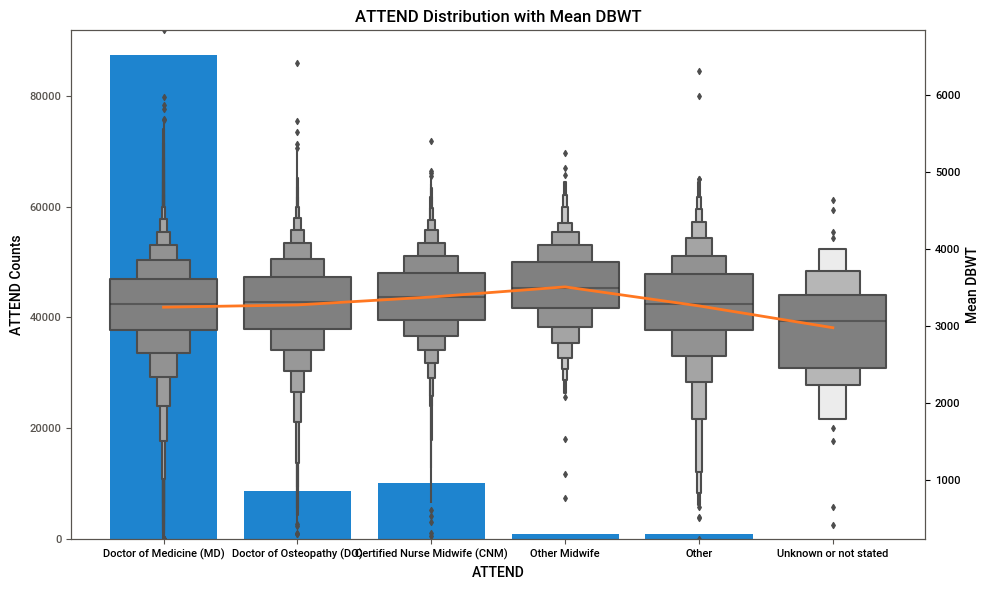

In [20]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'ATTEND', chart="boxenplot")

#### BFACIL: Birth Place

    Hospital - Coded as 1
    Freestanding Birth Center - Coded as 2 
    Home (intended) - Coded as 3
    Home (not intended) - Coded as 4
    Home (unknown if intended) - Coded as 5
    Clinic - Coded as 6
    Doctor’s Office - Coded as 7 
    Other  - Coded as 8 
    Unknown - Coded as 9

In [21]:
BFACIL = {
    1: "Hospital",
    2: "Freestanding Birth Center",
    3: "Home (intended)",
    4: "Home (not intended)",
    5: "Home (unknown if intended)",
    6: "Clinic",
    7: "Doctor Office",
    8: "Other",
    9: "Unknown"
    }
train_analysis['BFACIL'] = train_analysis['BFACIL'].map(BFACIL)    
train_analysis['BFACIL'] = pd.Categorical(train_analysis['BFACIL'], categories=BFACIL.values(), ordered=True)

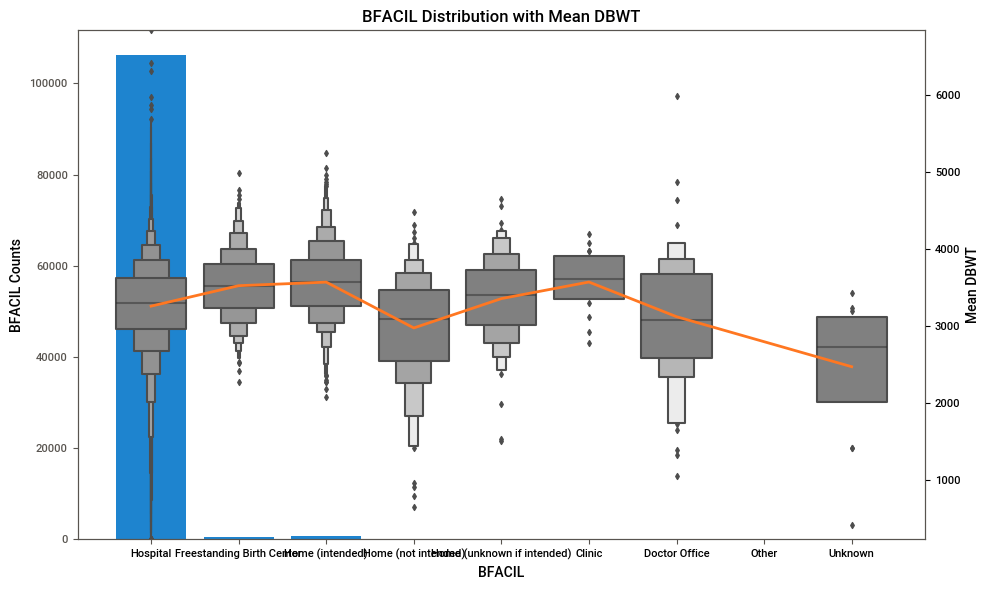

In [22]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'BFACIL', chart="boxenplot")

#### BMI

    13.0-69.9 Body Mass Index 
    99.9  Unknown or not stated

BMI in classes
    
    Extreme Underweight: BMI less than 16.5
    Underweight: BMI between 16.5 and 18.5
    Normal weight: BMI between 18.5 and 24.9
    Overweight 25.0-29.9
    Obesity 1: BMI between 30.0 and 34.9
    Obesity 2: BMI between 35.0 and 39.9
    Obesity 3 (Extreme Obesity): >=40

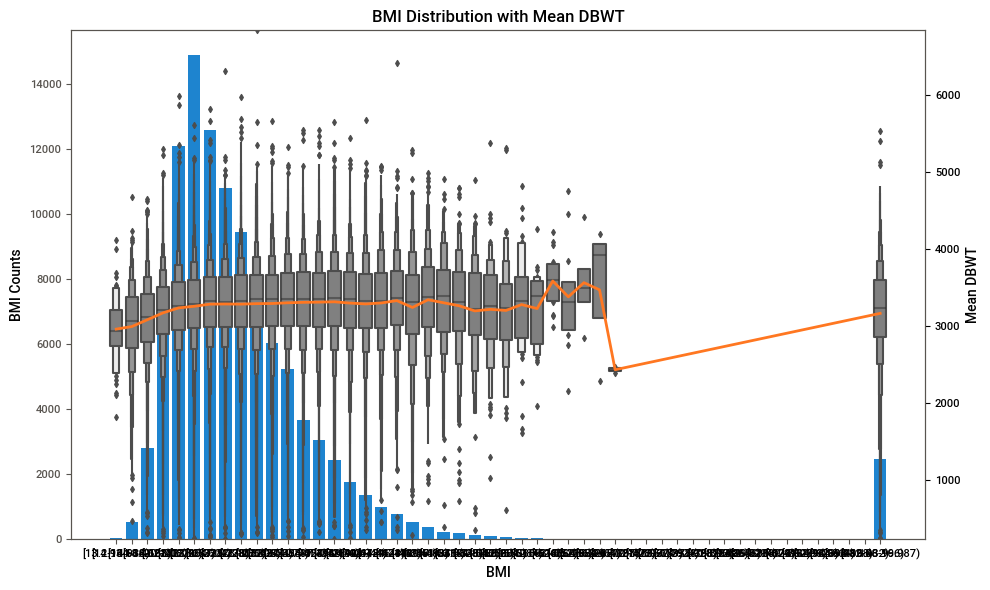

In [23]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'BMI', bins=50, chart="boxenplot")

In [24]:
bins = [-np.inf, 16.5, 18.5, 25, 30, 35, 40, 90, np.inf]
labels = ['Extreme Underweight', 'Underweight', 'Normal weight', 'Overweight', 'Obesity 1', 'Obesity 2', 'Extreme Obesity','Unknown']
train_analysis['BMI_Category'] = pd.cut(train_analysis['BMI'], bins=bins, labels=labels, right=False)

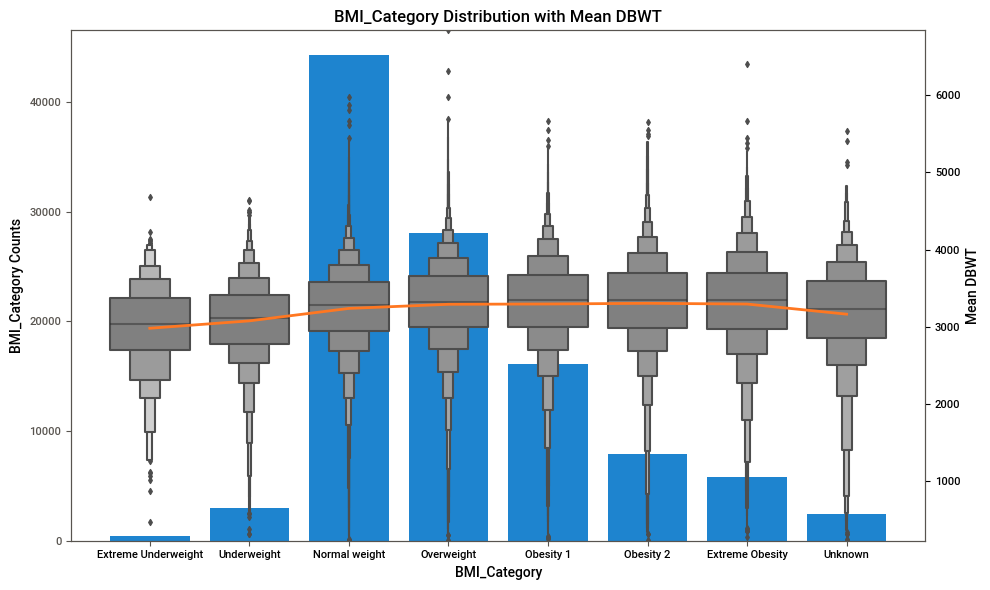

In [25]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'BMI_Category', chart="boxenplot")

#### CIG_0: Cigarettes Before Pregnancy

    00-97 Number of cigarettes daily
    98 or more cigarettes
    99 Unknown or not 


    0  Nonsmoker
    1-5
    6-10
    11-20
    21-40
    41-98
    98 >98
    99 Unknown


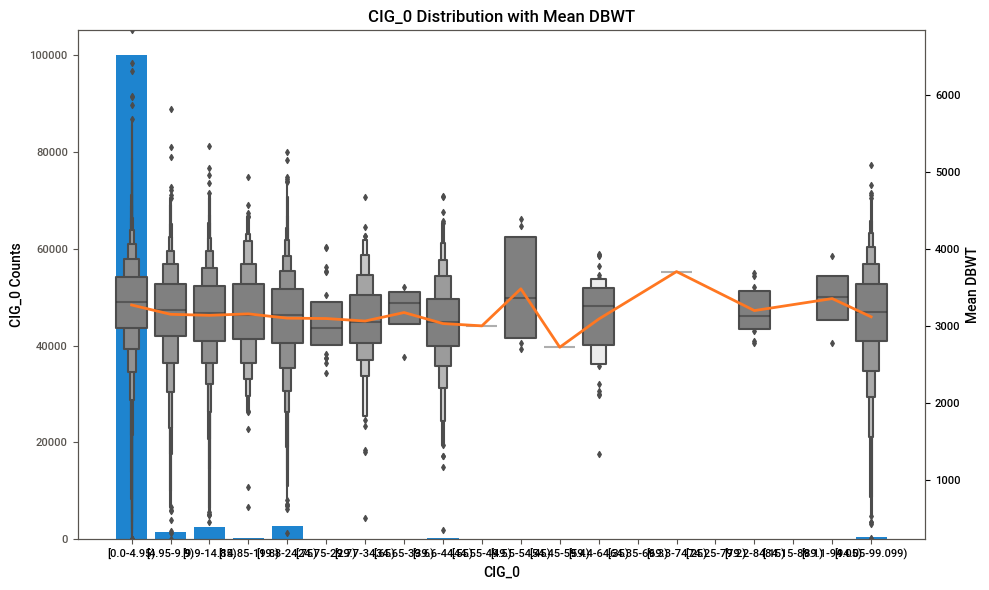

In [26]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'CIG_0', bins=20, chart="boxenplot")

In [27]:
bin_edges = [-1, 0, 5, 10, 20, 40, 97, 98.9, 99.1]
labels = ['Nonsmoker', '1-5', '6-10', '11-20', '21-40', '41-98', '>98', 'Unknown']
# Create a new categorical column 'Recoded_Variable'
train_analysis['CIG_0'] = pd.cut(train_analysis['CIG_0'], bins=bin_edges, labels=labels, right=True)


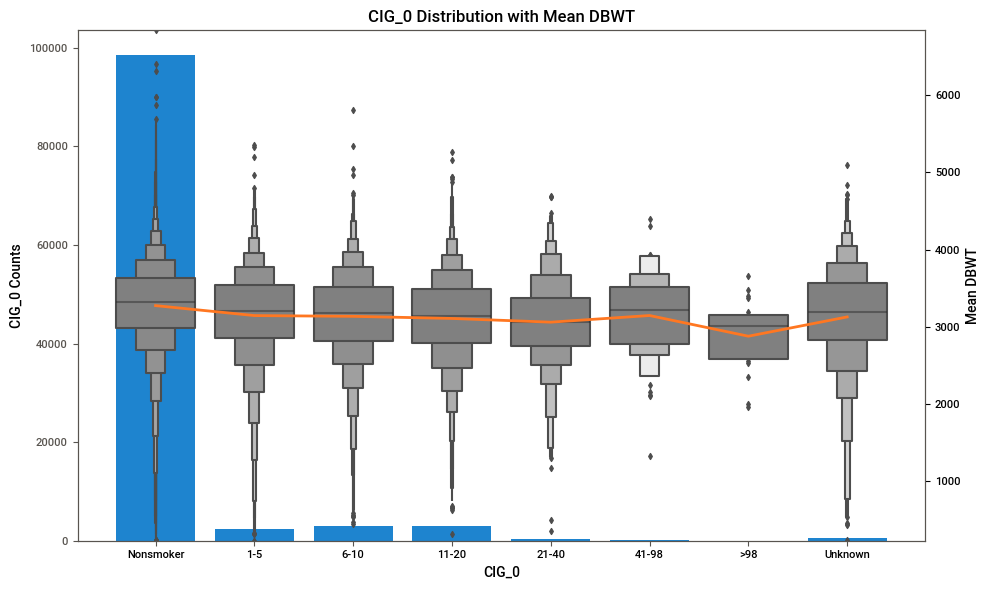

In [28]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'CIG_0', chart="boxenplot")

#### DLMP_MM Last:  Normal Menses Month

    January - coded as 1
    February - coded as 2 
    March - coded as 3
    ...  
    December - coded as 12
    Unknown or not stated - coded as 99

In [29]:
# Define the categories and their order
categories = list(range(1, 13))
categories.append(99)

#Create a new categorical ordinal column 'Ordinal_Category'
train_analysis['DLMP_MM'] = pd.Categorical(train_analysis['DLMP_MM'], categories=categories, ordered=True)

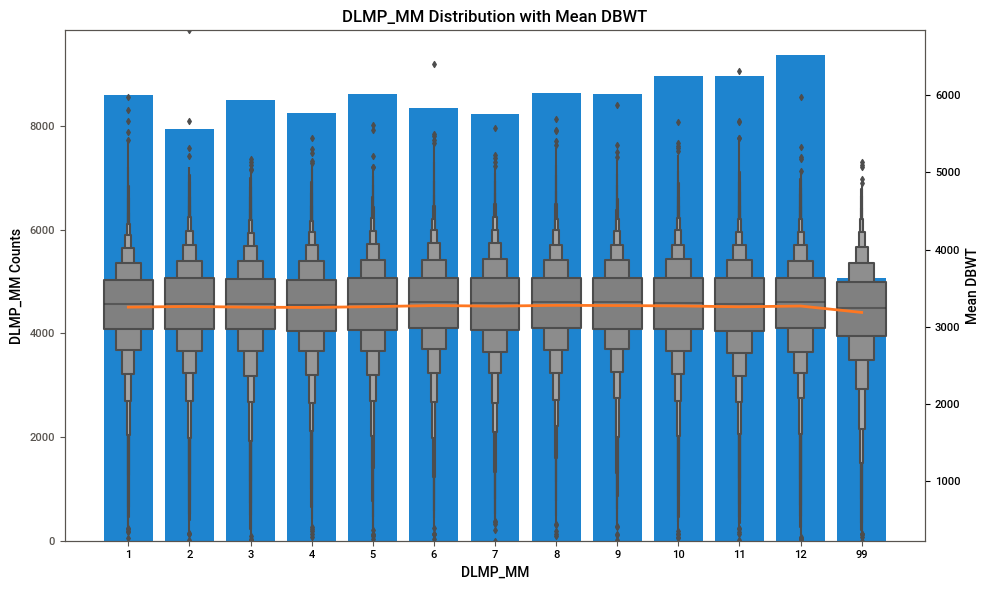

In [30]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'DLMP_MM', chart="boxenplot")

#### DMAR 
    1 Married 
    2 Unmarried
    "" Other

In [31]:
# Define the mapping dictionary
DMAR= {'1': 'Married', '2': 'Unmarried', '':'Unknown'}

train_analysis['DMAR'] = train_analysis['DMAR'].replace(DMAR)
train_analysis['DMAR'] = train_analysis['DMAR'].str.strip().replace('', 'Unknown')

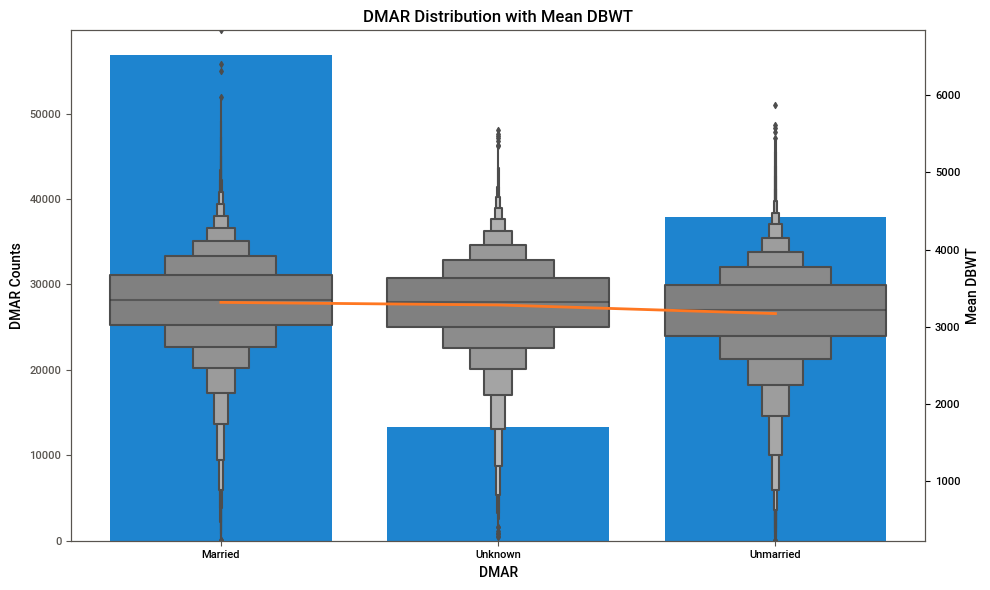

In [32]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'DMAR', chart="boxenplot")

#### DOB_MM
1 to 12 birth months

In [33]:
# Define the categories and their order
categories = list(range(1, 13))

#Create a new categorical ordinal column 'Ordinal_Category'
train_analysis['DOB_MM'] = pd.Categorical(train_analysis['DOB_MM'], categories=categories, ordered=True)

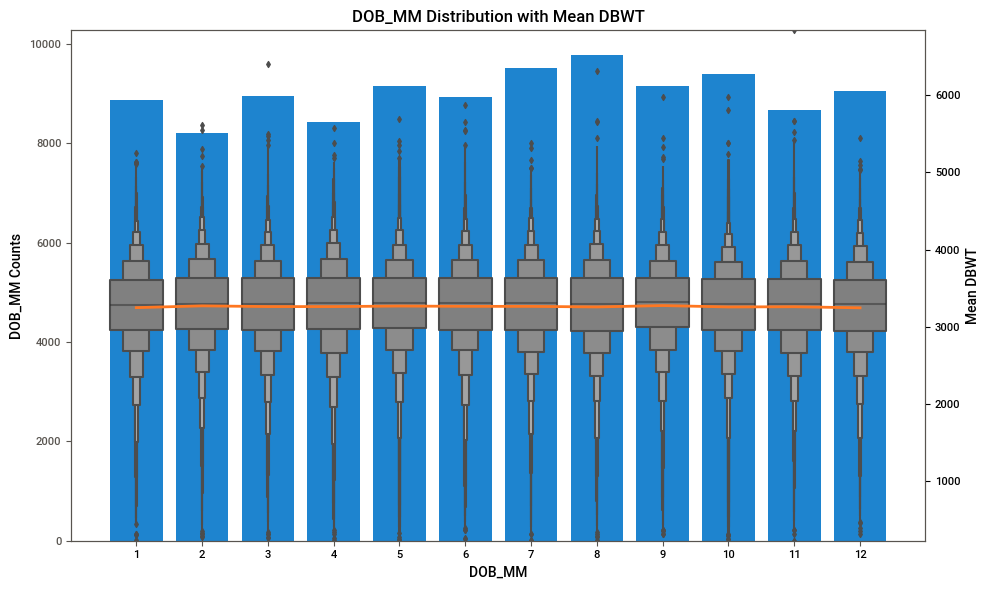

In [34]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'DOB_MM', chart="boxenplot")

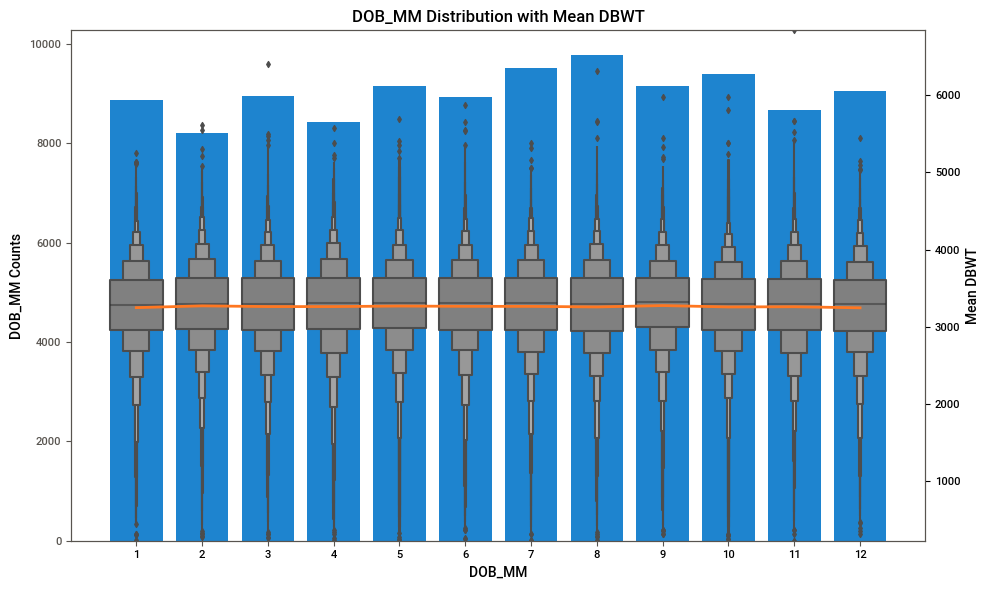

In [35]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'DOB_MM', bins=12, chart="boxenplot")

#### DOB_TT : 

Time of Birth 

0000-2359 Time of Birth

9999 Not Stated

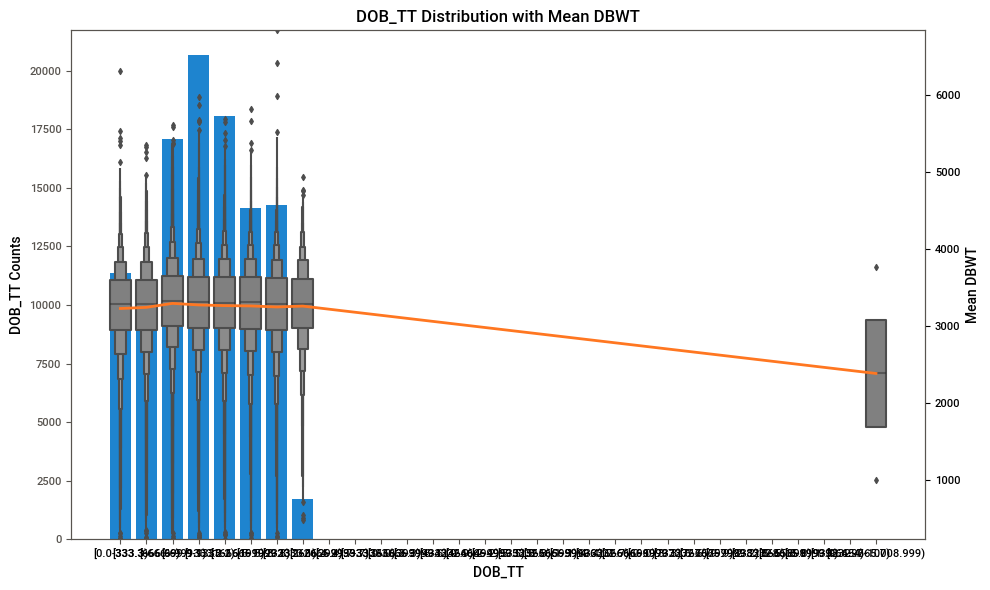

In [36]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'DOB_TT', bins=30, chart="boxenplot")

#### DOB_WK 
week day 1-7

In [37]:
# Define the categories and their order
categories = list(range(1, 8))

#Create a new categorical ordinal column 'Ordinal_Category'
train_analysis['DOB_WK'] = pd.Categorical(train_analysis['DOB_WK'], categories=categories, ordered=True)

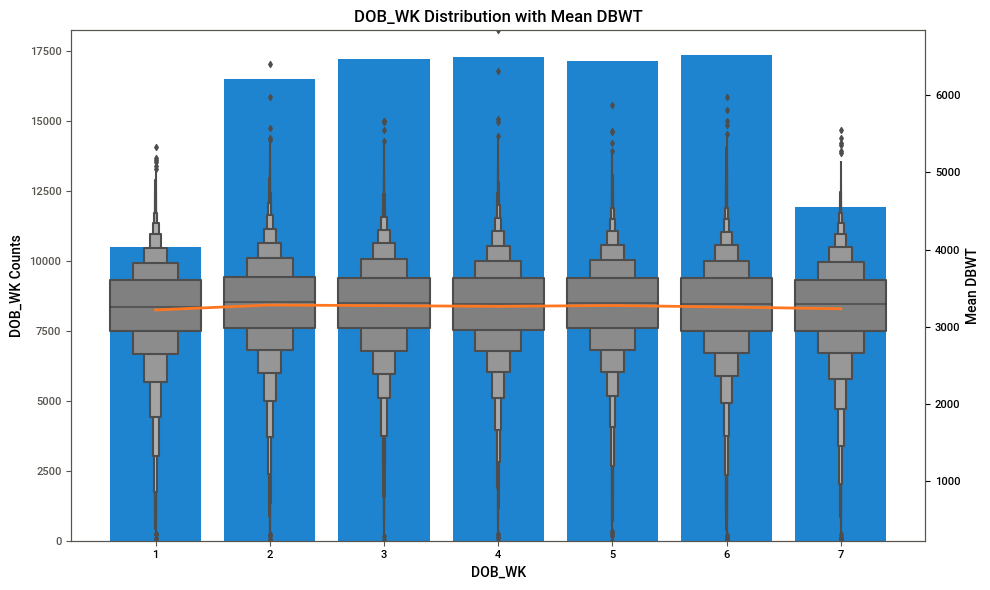

In [38]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'DOB_WK', bins=7, chart="boxenplot")

#### FAGECOMB - Father’s Combined Age
    
    09-98 Father’s combined age in years
    99 Unknown or not stated

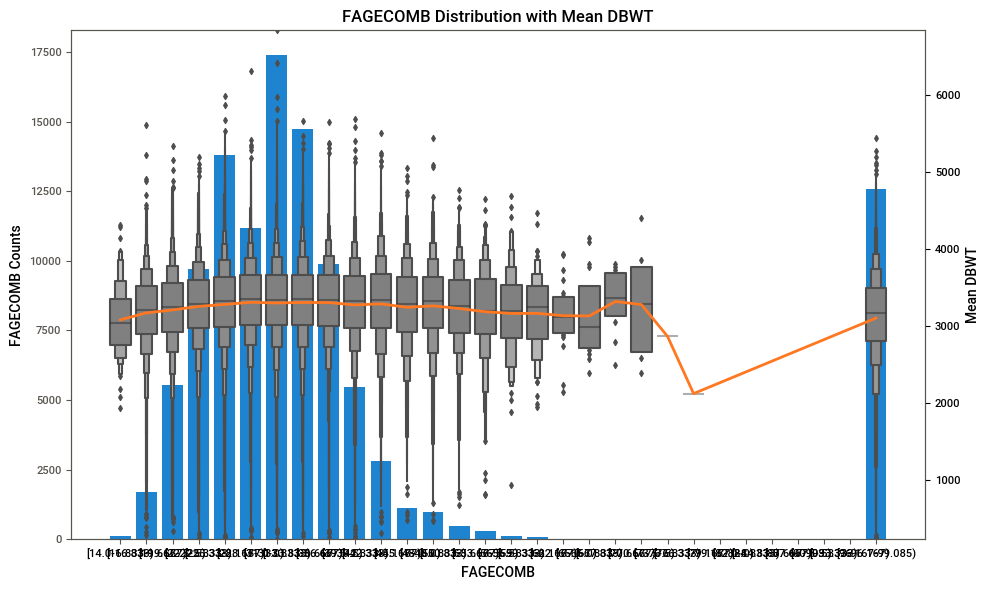

In [39]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'FAGECOMB', bins=30, chart="boxenplot")

#### FEDUC - Father’s Education

    1 8 th grade or less
    Use reporting flag in field 165 2 9 th through 12th grade with no diploma
    3 High school graduate or GED completed
    4 Some college credit, but not a degree.
    5 Associate degree (AA,AS)
    6 Bachelor’s degree (BA, AB, BS)
    7 Master’s degree (MA, MS, MEng, MEd, MSW, MBA)
    8 Doctorate (PhD, EdD) or Professional Degree (MD, DDS,
    DVM, LLB, JD)
    9 Unknown

In [40]:
FEDUC = {
    1: "8class",
    2: "9-12class",
    3: "High School-GED",
    4: "Some college ",
    5: "Associate degree",
    6: "Bachelor’s degree",
    7: "Master’s degree",
    8: "Doctorate ",
    9: "Unknown"
    }   


train_analysis['FEDUC'] = train_analysis['FEDUC'].map(FEDUC)
train_analysis['FEDUC'] = pd.Categorical(train_analysis['FEDUC'], categories=FEDUC.values(), ordered=True)

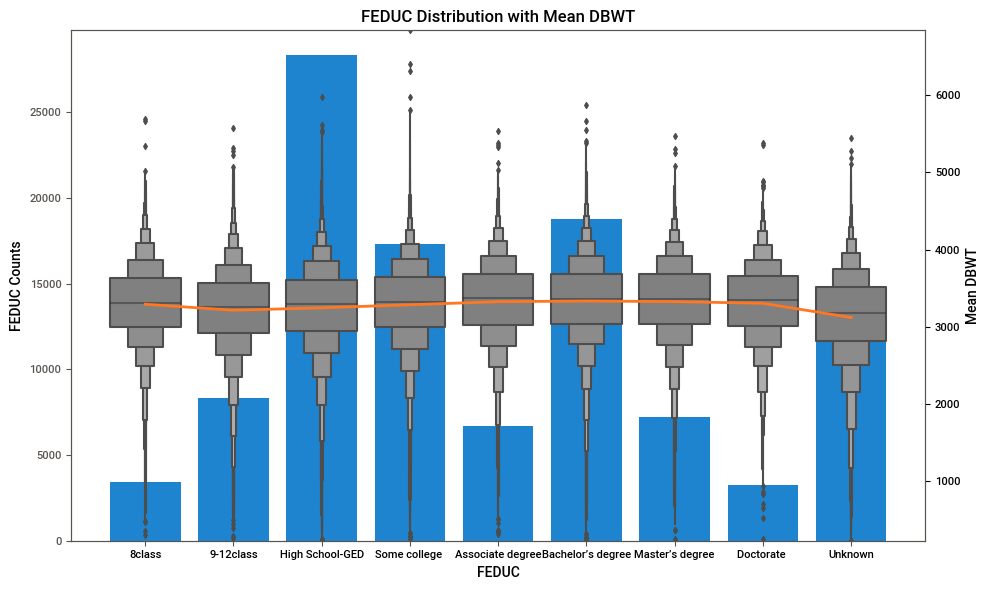

In [41]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'FEDUC', chart="boxenplot")

#### ILLB_R  - LB_R Interval Since Last Live Birth Recode

    000-003 Plural delivery
    004-300 Months since last live birth
    888 Not applicable / 1st live birth
    999 Unknown or not stated

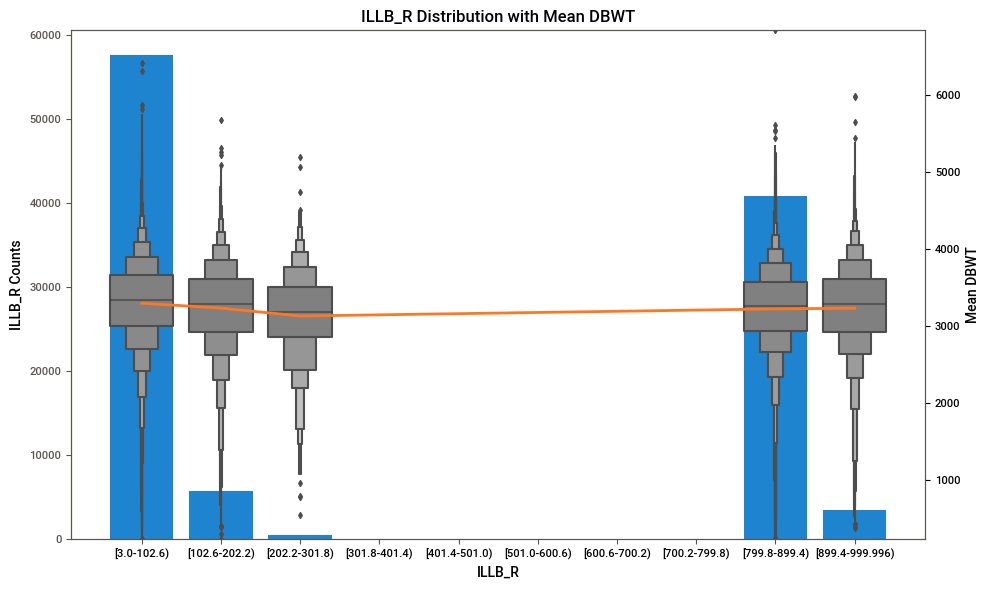

In [42]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'ILLB_R', chart="boxenplot")

#### ILOP_R: Interval Since Last Other Pregnancy Recode 

    000-003 Plural delivery
    004-300 Months since last live birth
    888 Not applicable / 1st natality event
    999 Unknown or not stated

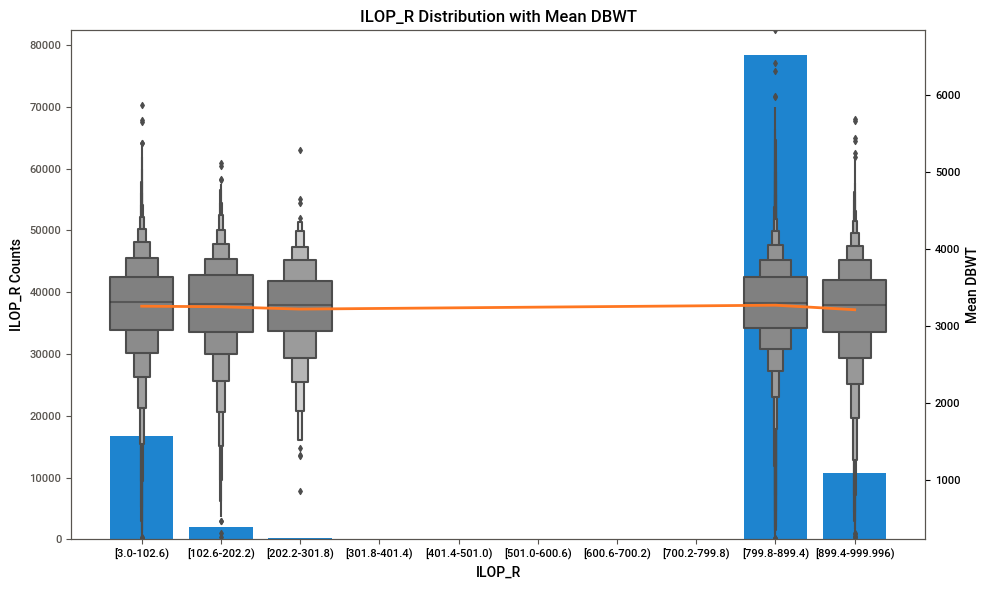

In [43]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'ILOP_R', chart="boxenplot")

#### ILP_R: nterval Since Last Pregnancy Recode

    000-003 Plural delivery
    888 Not applicable / no previous pregnancy
    999 Unknown or not stated

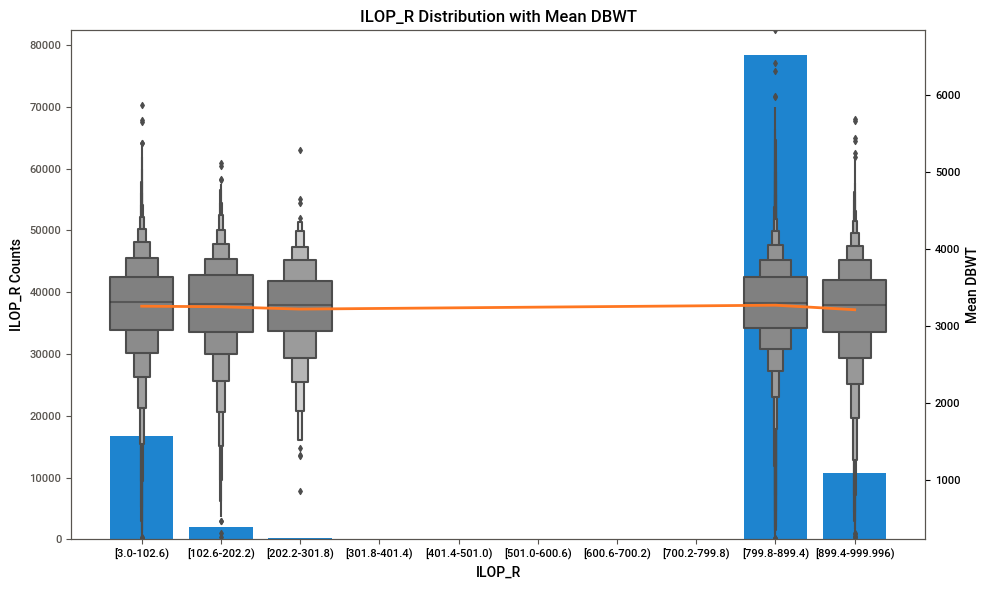

In [44]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'ILOP_R', chart="boxenplot")

#### LD_INDL

    Y Yes
    N No
    U Unknown or not stated

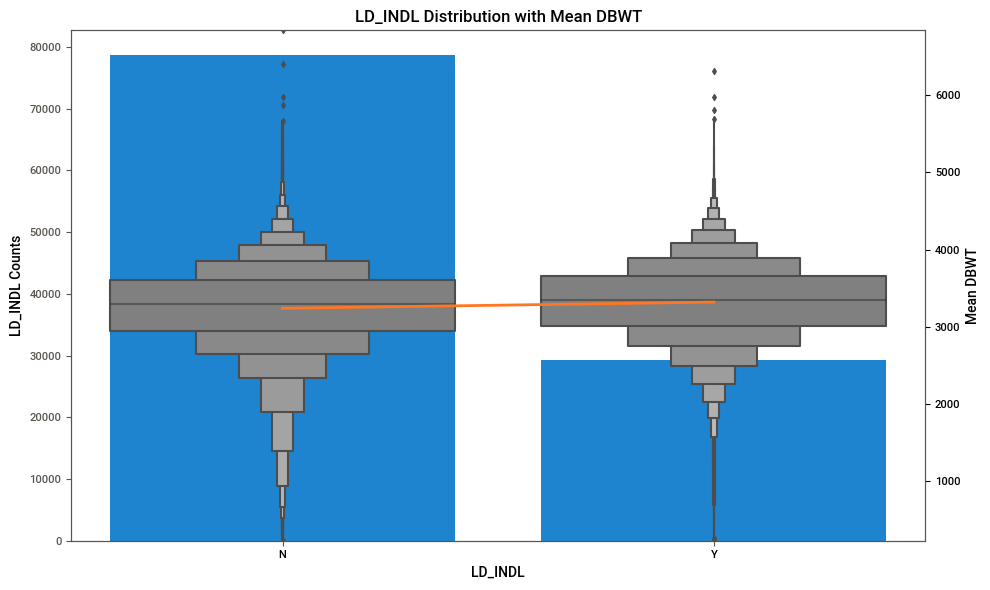

In [45]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'LD_INDL', chart="boxenplot")

#### MAGER - Mother’s Single Years of Age

12 10 – 12 years
12-50 
50>

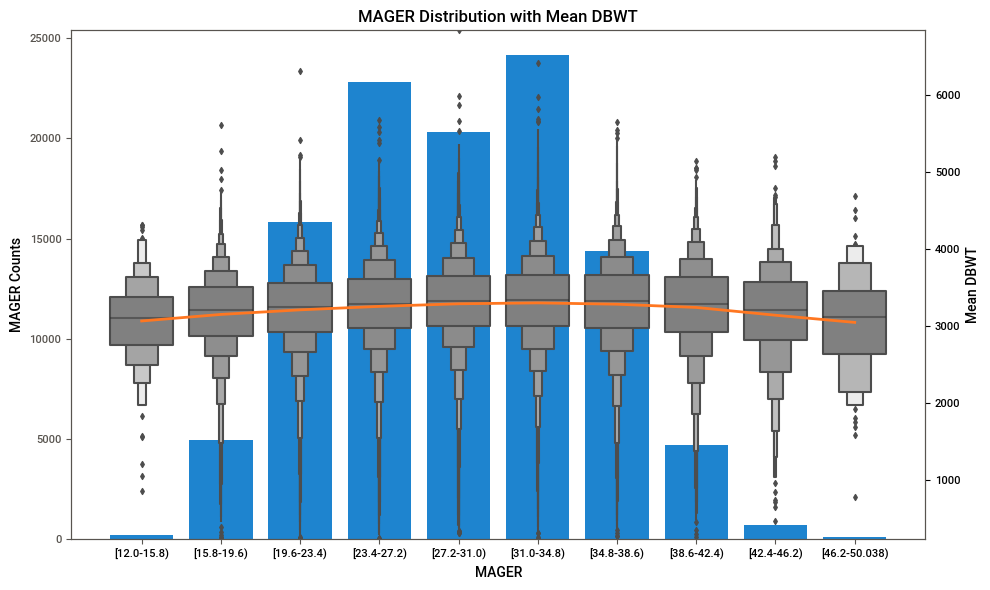

In [46]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'MAGER', chart="boxenplot")

#### MBSTATE_REC  Mother’s Nativity

1 Born in the U.S. (50 US States)
2 Born outside the U.S. (includes possessions)
3 Unknown or Not Stated


In [47]:
MBSTATE_REC = {
    1: "born in US",
    2: "born not in US",
    3: "Unknown",
    }   


train_analysis['MBSTATE_REC'] = train_analysis['MBSTATE_REC'].map(MBSTATE_REC)
train_analysis['MBSTATE_REC'] = pd.Categorical(train_analysis['MBSTATE_REC'], categories=MBSTATE_REC.values(), ordered=True)

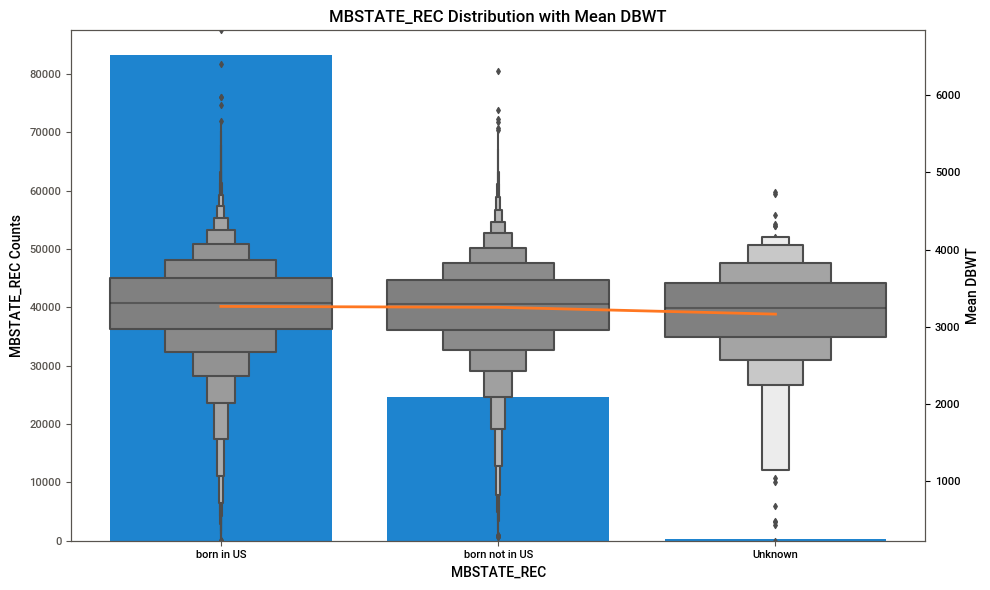

In [48]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'MBSTATE_REC', chart="boxenplot")

#### MEDUC  - MEDUC Mother’s Education

    1 8 th grade or less
    2 9 th through 12th grade with no diploma
    3 High school graduate or GED completed
    4 Some college credit, but not a degree.
    5 Associate degree (AA,AS)
    6 Bachelor’s degree (BA, AB, BS)
    7 Master’s degree (MA, MS, MEng, MEd, MSW, MBA)
    8 Doctorate (PhD, EdD) or Professional Degree (MD, DDS,
    DVM, LLB, JD)
    9 Unknown

In [49]:
MEDUC = {
    1: "8class",
    2: "9-12class",
    3: "High School-GED",
    4: "Some college ",
    5: "Associate degree",
    6: "Bachelor’s degree",
    7: "Master’s degree",
    8: "Doctorate ",
    9: "Unknown"
    }   


train_analysis['MEDUC'] = train_analysis['MEDUC'].map(MEDUC)
train_analysis['MEDUC'] = pd.Categorical(train_analysis['MEDUC'], categories=MEDUC.values(), ordered=True)

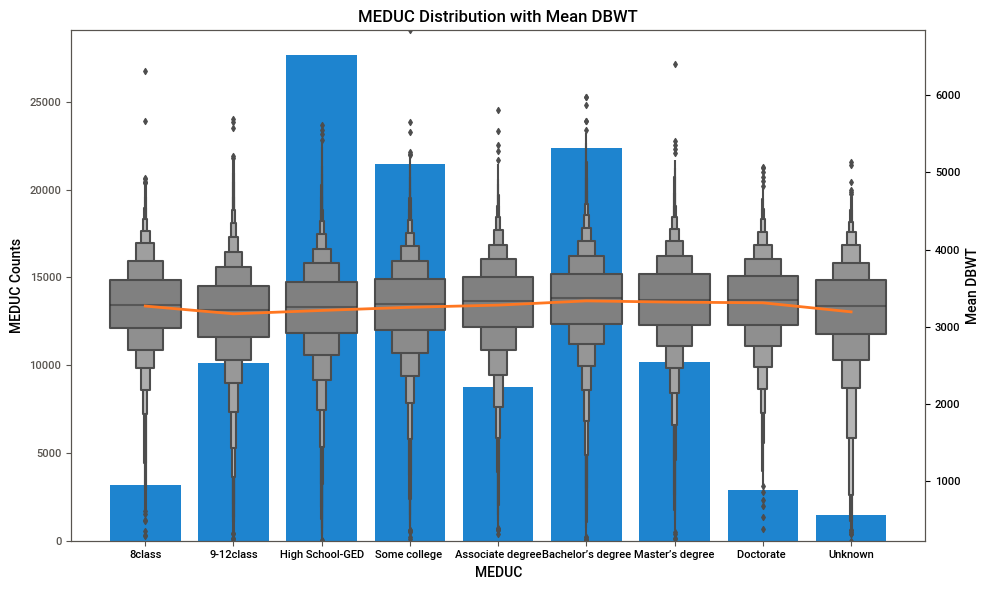

In [50]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'MEDUC', chart="boxenplot")

#### M_Ht_In -Mother’s Height in Total Inches

    30-78 Height in inches
    99 Unknown or not stated

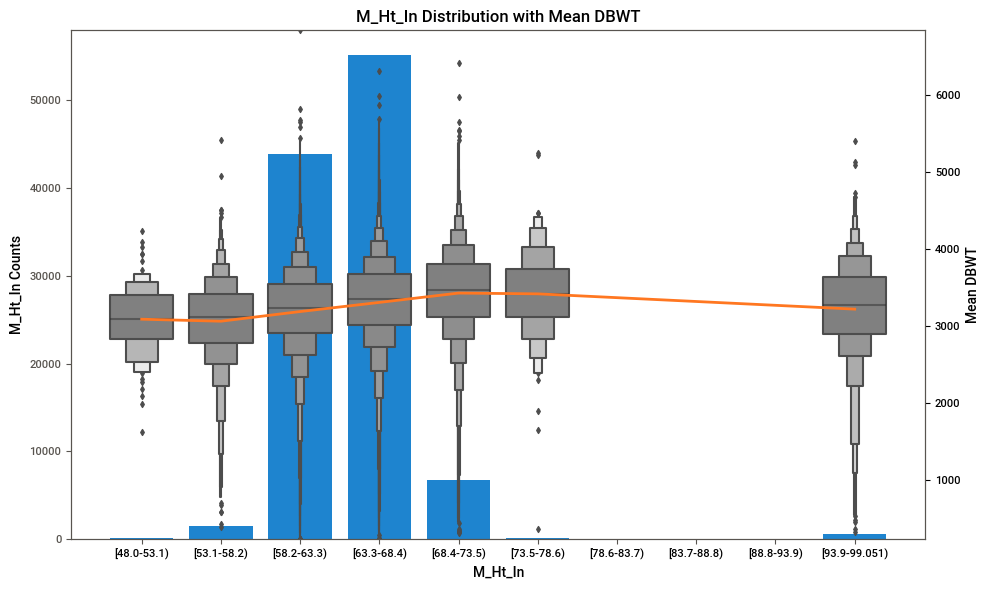

In [51]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'M_Ht_In', chart="boxenplot")

#### NO_INFEC - No Infections Reporte

    1 True
    0 False
    9 Not Reported




In [52]:
NO_INFEC = {
    0: "True",
    1: "False",
    9: "Not Reported"
    }   


train_analysis['NO_INFEC'] = train_analysis['NO_INFEC'].map(NO_INFEC)
train_analysis['NO_INFEC'] = pd.Categorical(train_analysis['NO_INFEC'], categories=NO_INFEC.values(), ordered=True)

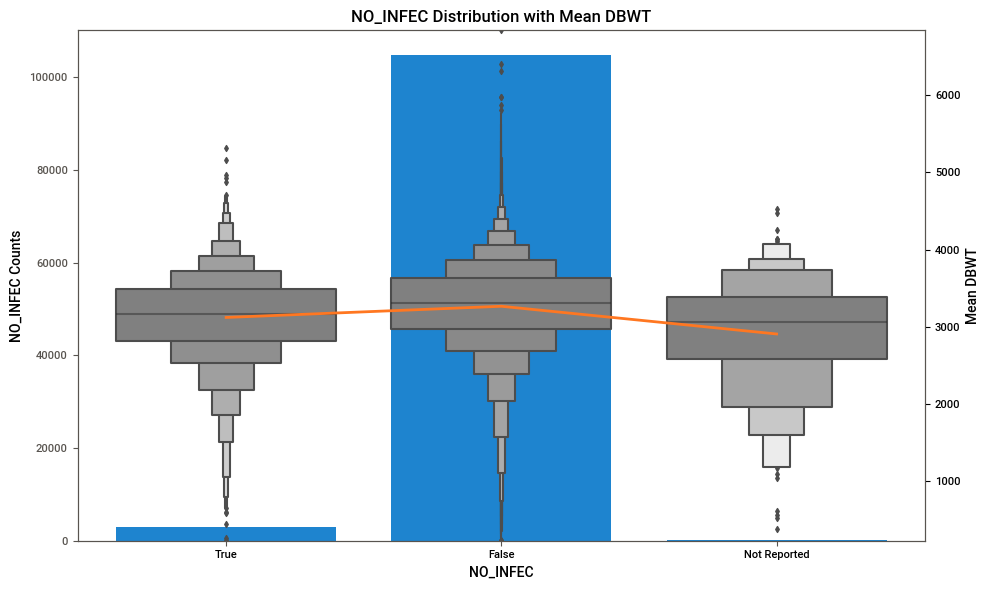

In [53]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'NO_INFEC', chart="boxenplot")

#### NO_MMORB - No Maternal Morbidity Reported

    1 True
    0 False
    9 Not Reported


In [54]:
NO_MMORB = {
    0: "True",
    1: "False",
    9: "Not Reported"
    }   


train_analysis['NO_MMORB'] = train_analysis['NO_MMORB'].map(NO_MMORB)
train_analysis['NO_MMORB'] = pd.Categorical(train_analysis['NO_MMORB'], categories=NO_MMORB.values(), ordered=True)

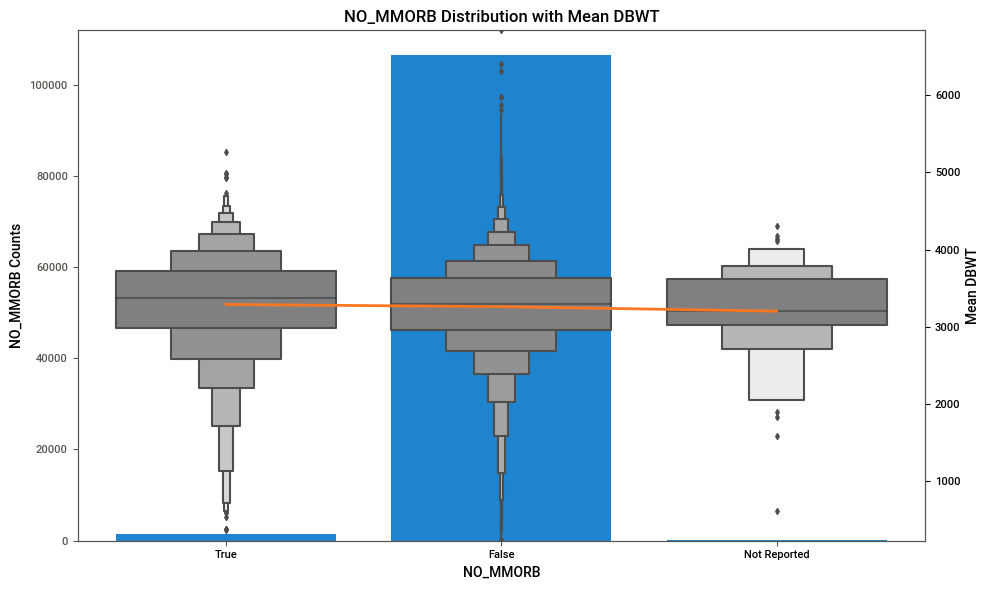

In [55]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'NO_MMORB', chart="boxenplot")

#### NO_RISKS - No Risk Factors Reported 

    1 True
    0 False
    9 Not Reported

In [56]:
NO_RISKS = {
    0: "True",
    1: "False",
    9: "Not Reported"
    }   


train_analysis['NO_RISKS'] = train_analysis['NO_RISKS'].map(NO_RISKS)
train_analysis['NO_RISKS'] = pd.Categorical(train_analysis['NO_RISKS'], categories=NO_RISKS.values(), ordered=True)

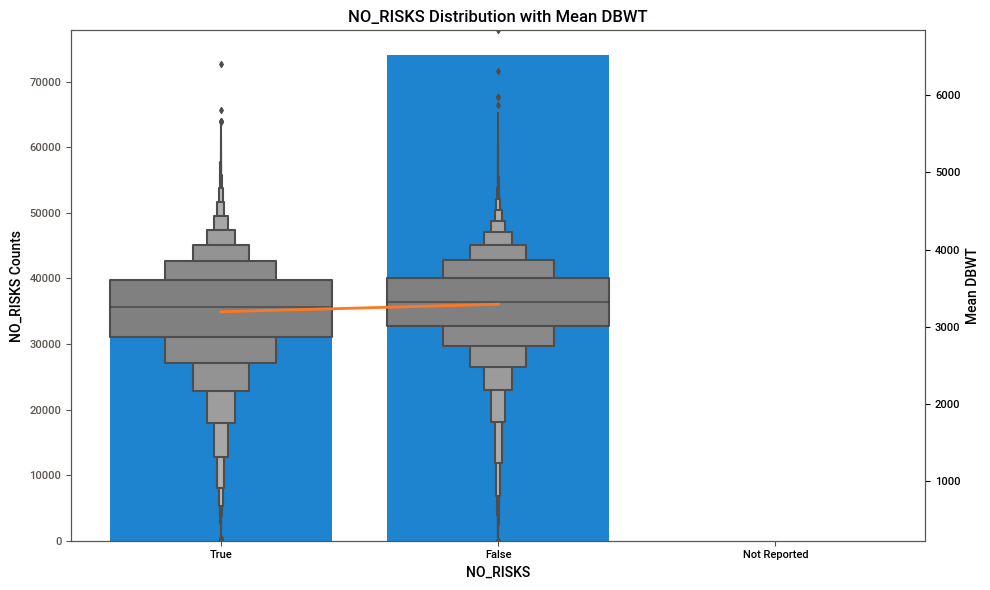

In [57]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'NO_RISKS', chart="boxenplot")

#### PAY - payment Source for Delivery

    1 Medicaid
    2 Private Insurance
    3 Self-Pay
    4 Indian Health Service
    5 CHAMPUS/TRICARE
    6 Other Government (Federal, State, Local)
    8 Other
    9 Unknown


In [58]:
PAY = {
    1: "Medicaid",
    2: "Private Insurance",
    3: "Self-Pay",
    4: "Indian Health Service",
    5: "CHAMPUS/TRICARE",
    6: "Other Government",
    8: "Other ",
    9: "Unknown"
    }   


train_analysis['PAY'] = train_analysis['PAY'].map(PAY)
train_analysis['PAY'] = pd.Categorical(train_analysis['PAY'], categories=PAY.values(), ordered=True)

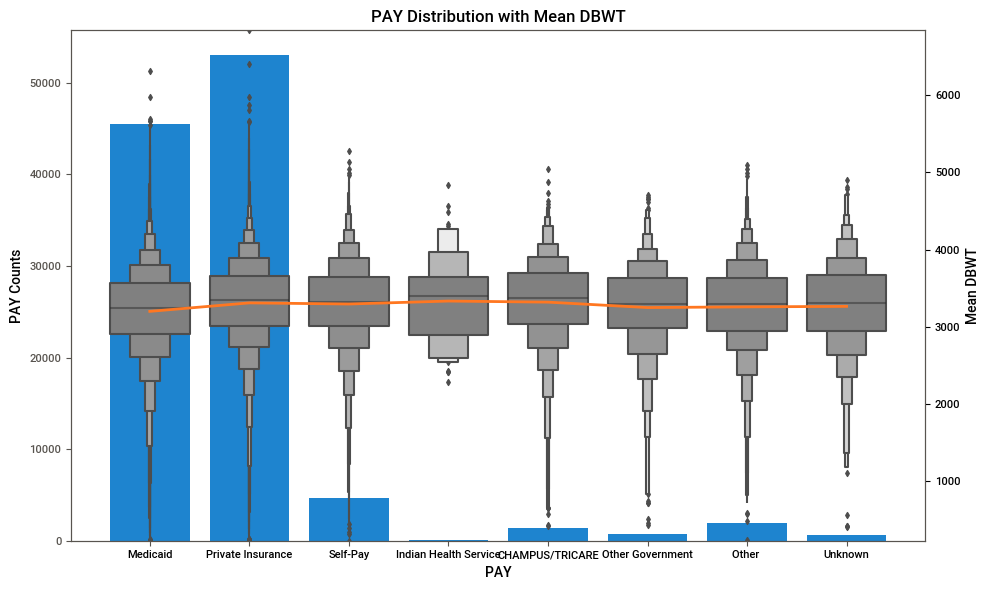

In [59]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'PAY', chart="boxenplot")

#### PAY_REC - payment Recode

    1 Medicaid
    2 Private Insurance
    3 Self Pay
    4 Other
    9 Unknown


In [60]:
PAY_REC = {
    1: "Medicaid",
    2: "Private Insurance",
    3: "Self-Pay",
    4: "Other",
    9: "Unknown"
    }   


train_analysis['PAY_REC'] = train_analysis['PAY_REC'].map(PAY_REC)
train_analysis['PAY_REC'] = pd.Categorical(train_analysis['PAY_REC'], categories=PAY_REC.values(), ordered=True)

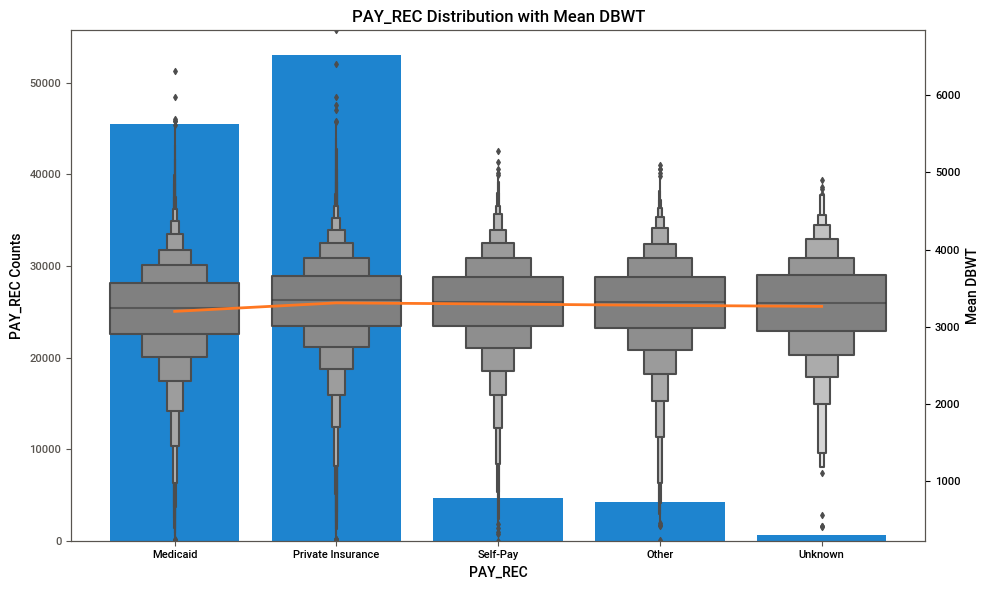

In [61]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'PAY_REC', chart="boxenplot")

#### PRECARE - Month Prenatal Care Began

    00 No prenatal care
    01-10 Month prenatal care began
    99 Unknown or not stated

In [62]:
# Define the categories and their order
categories = list(range(0, 11))
categories.append(99)

#Create a new categorical ordinal column 'Ordinal_Category'
train_analysis['PRECARE'] = pd.Categorical(train_analysis['PRECARE'], categories=categories, ordered=True)

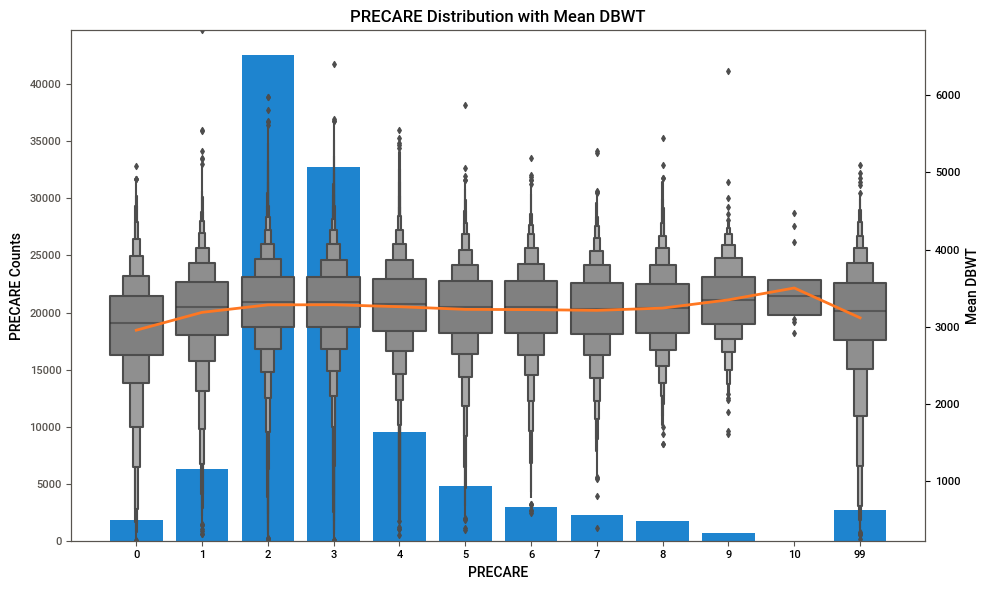

In [63]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'PRECARE', bins= 100, chart="boxenplot")

#### PREVIS  - Number of Prenatal Visit

    00-98 Number of prenatal visits
    99 Unknown or not stated

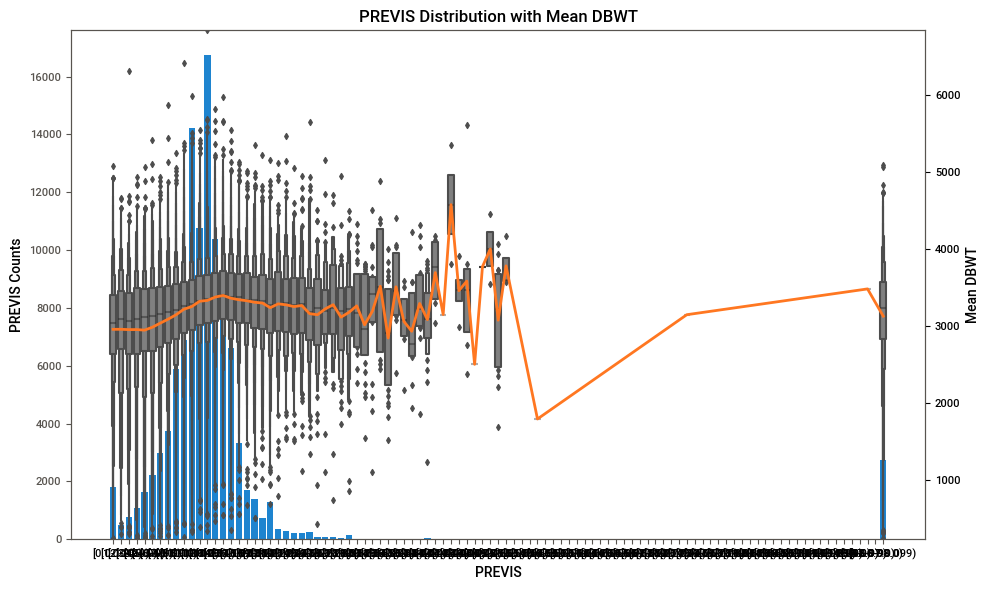

In [64]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'PREVIS', bins= 99, chart="boxenplot")

#### PRIORDEAD - Prior Births Now Dead 

    00-30 Number of children dead from previous live births.
    99 Unknown or not stated


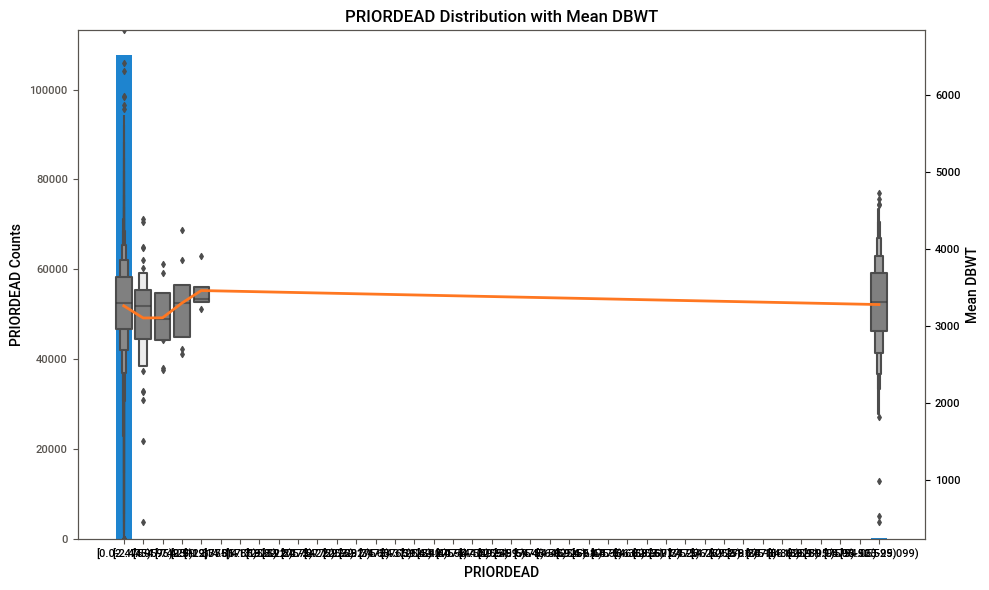

In [65]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'PRIORDEAD', bins= 40, chart="boxenplot")

#### PRIORLIVE - Prior Births Now living 

    00-30 Number of children still living from previous live births..
    99 Unknown or not stated

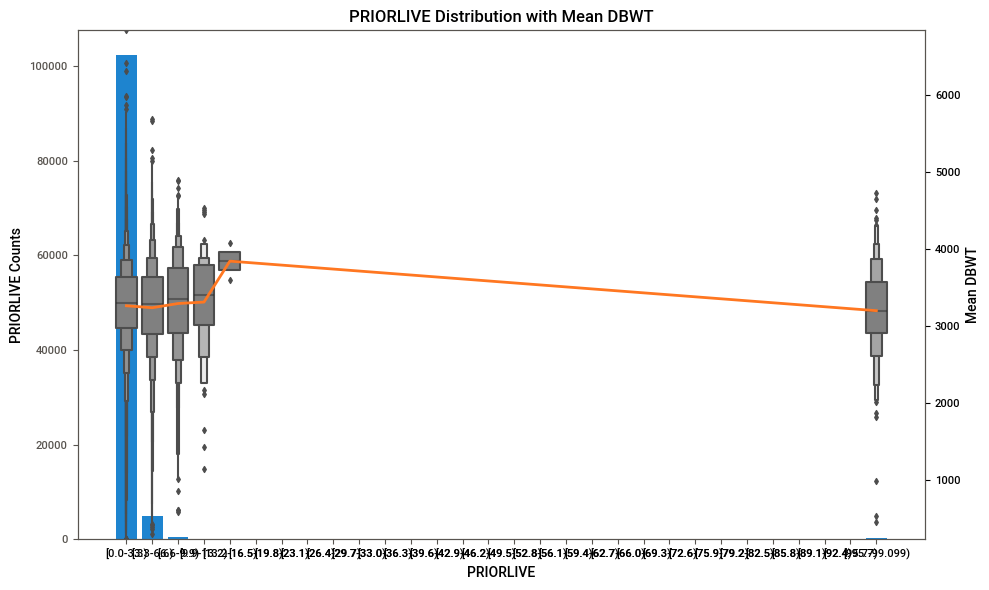

In [66]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'PRIORLIVE', bins= 30, chart="boxenplot")

#### PRIORTERM - Prior Other Terminations


    00-30 Number other terminations
    99 Unknown or not stated


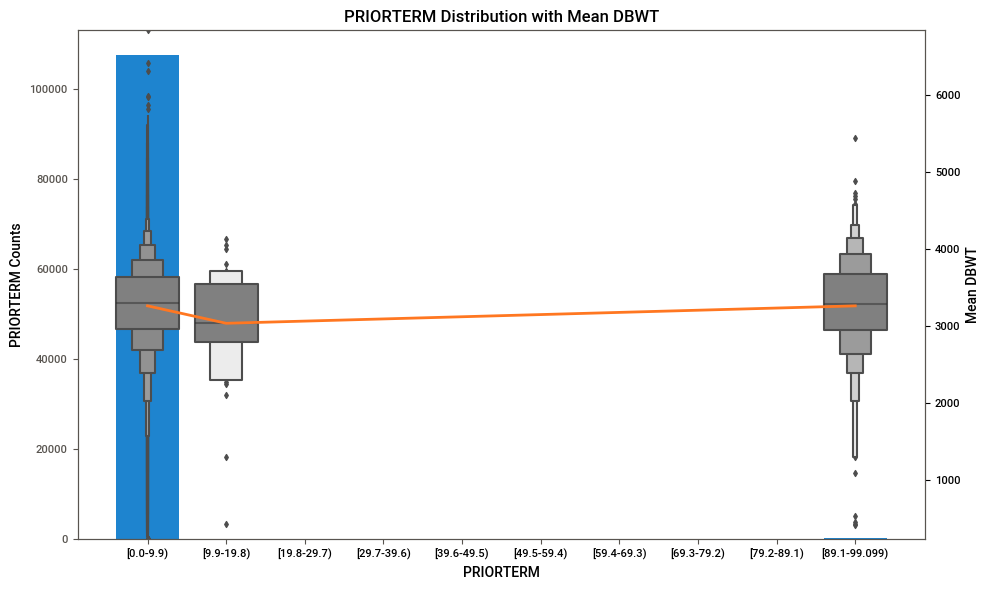

In [67]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'PRIORTERM', bins= 10, chart="boxenplot")

#### PWgt_R - Pre-pregnancy Weight Recode

    075-375 Weight in pounds
    999 Unknown or not stated

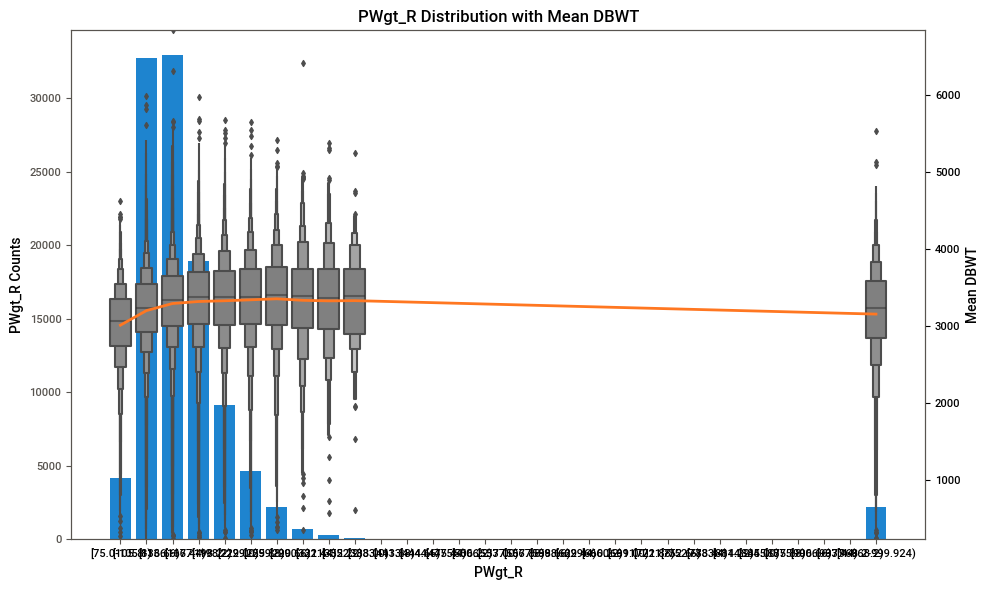

In [68]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'PWgt_R', bins= 30, chart="boxenplot")

#### RDMETH_REC - Delivery Method Recode 

    1 Vaginal (excludes vaginal after previous C-section)
    2 Vaginal after previous c-section
    3 Primary C-section
    4 Repeat C-section
    5 Vaginal (unknown if previous c-section)
    6 C-section (unknown if previous c-section)
    9 Not stated

Has code 
1 Vaginal
2 C-Section
9 Unknown

In [69]:
RDMETH_REC = {
    1: "Vaginal",
    2: "Vaginal after",
    3: "Primary C",
    4: "Repeat C",
    5: "Vaginal Unkn C",
    6: "C- section",
    9: "Unknown"
    }   


train_analysis['RDMETH_REC'] = train_analysis['RDMETH_REC'].map(RDMETH_REC)
train_analysis['RDMETH_REC'] = pd.Categorical(train_analysis['RDMETH_REC'], categories=RDMETH_REC.values(), ordered=True)

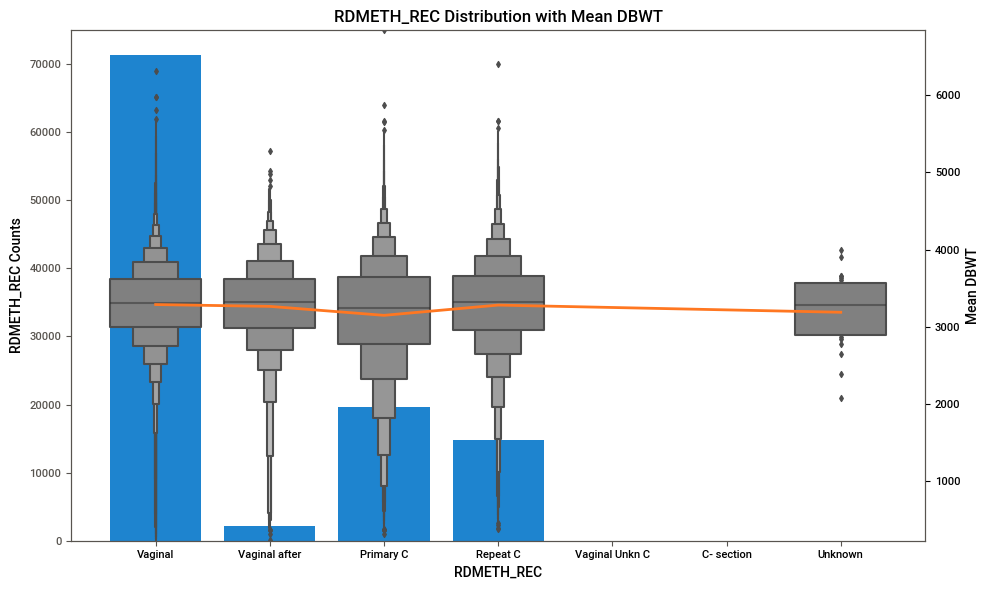

In [70]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'RDMETH_REC', chart="boxenplot")

#### RESTATUS - Residence Status

    1 RESIDENT
    2 INTRASTATE NONRESIDENT
    3 INTERSTATE NONRESIDENT
    4 FOREIGN RESIDENT

In [71]:
RESTATUS = {
    1: "RESIDENT",
    2: "INTRASTATE NONRESIDENT",
    3: "INTERSTATE NONRESIDENT",
    4: "FOREIGN RESIDENT"
    }   


train_analysis['RESTATUS'] = train_analysis['RESTATUS'].map(RESTATUS)
train_analysis['RESTATUS'] = pd.Categorical(train_analysis['RESTATUS'], categories=RESTATUS.values(), ordered=True)

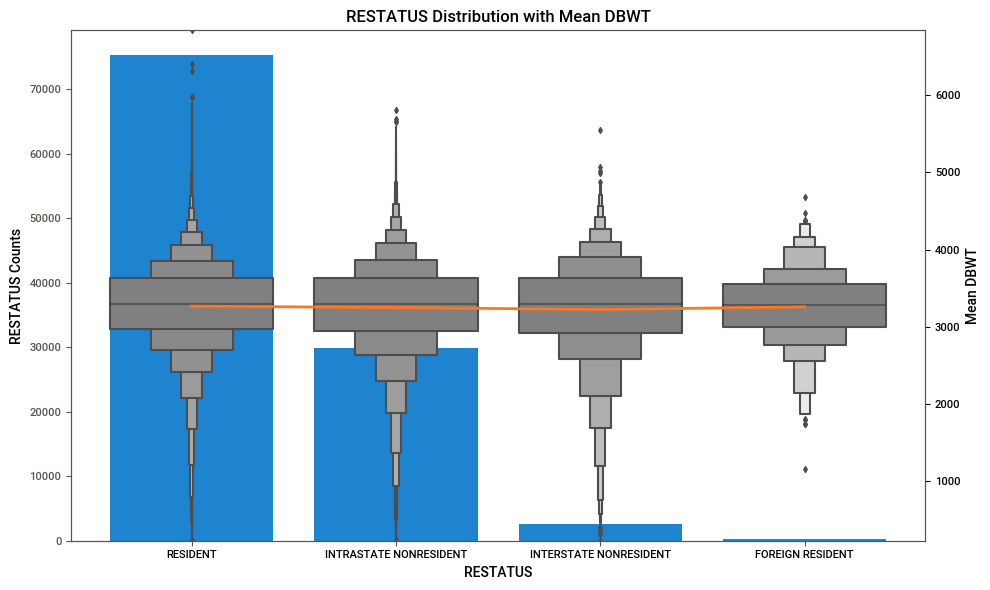

In [72]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'RESTATUS', bins= 50, chart="boxenplot")

#### RF_CESARN - Number of Previous Cesareans 
 
    00 None
    01-30 Number of previous cesareans
    99 Unknown or not stated

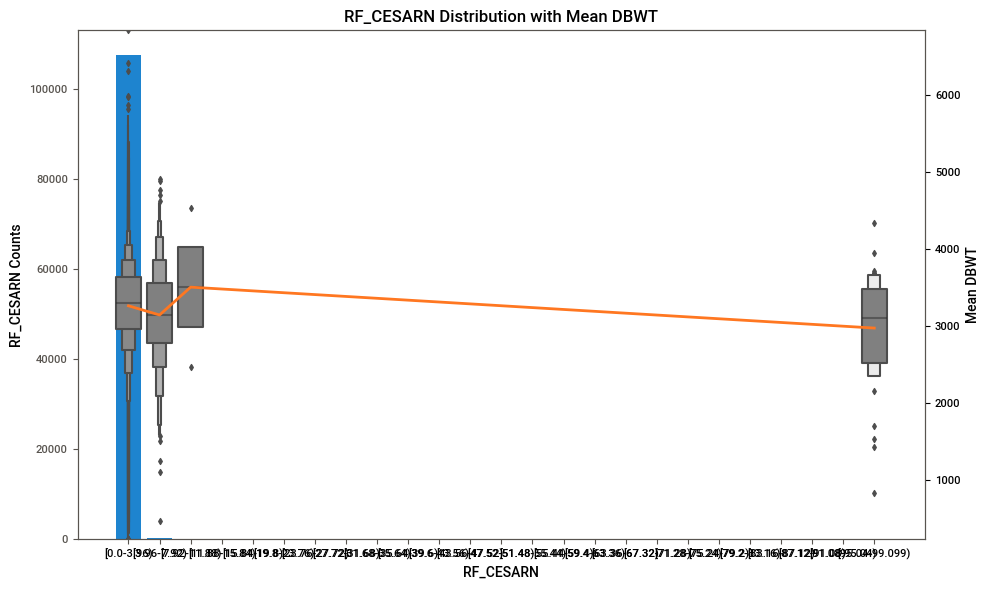

In [73]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'RF_CESARN', bins= 25, chart="boxenplot")

#### SEX

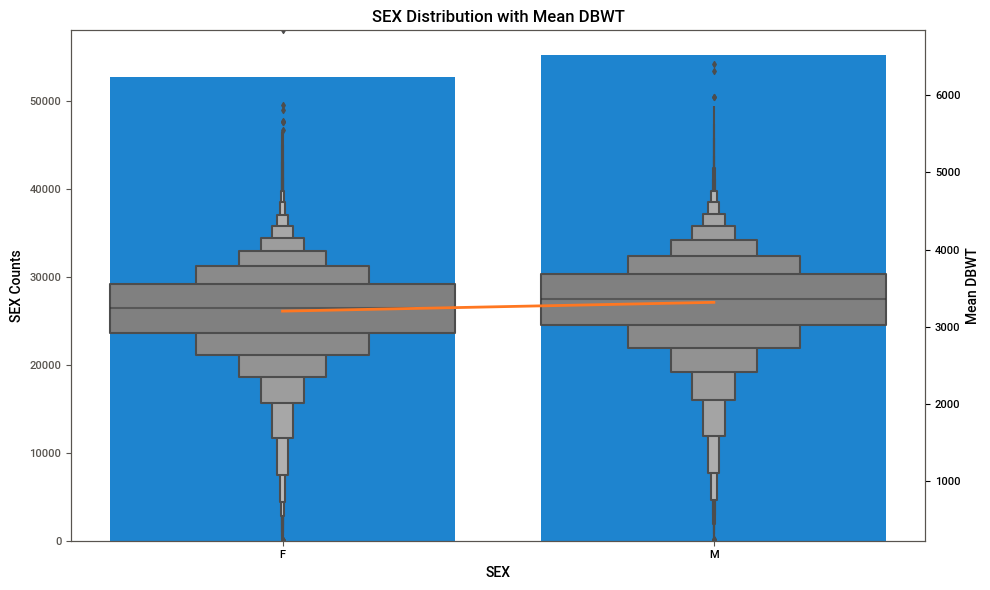

In [74]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'SEX', chart="boxenplot")

#### WTGAIN

    00-97 Weight gain
    98 Weight gain in pounds pounds and over
    99 Unknown or not stated

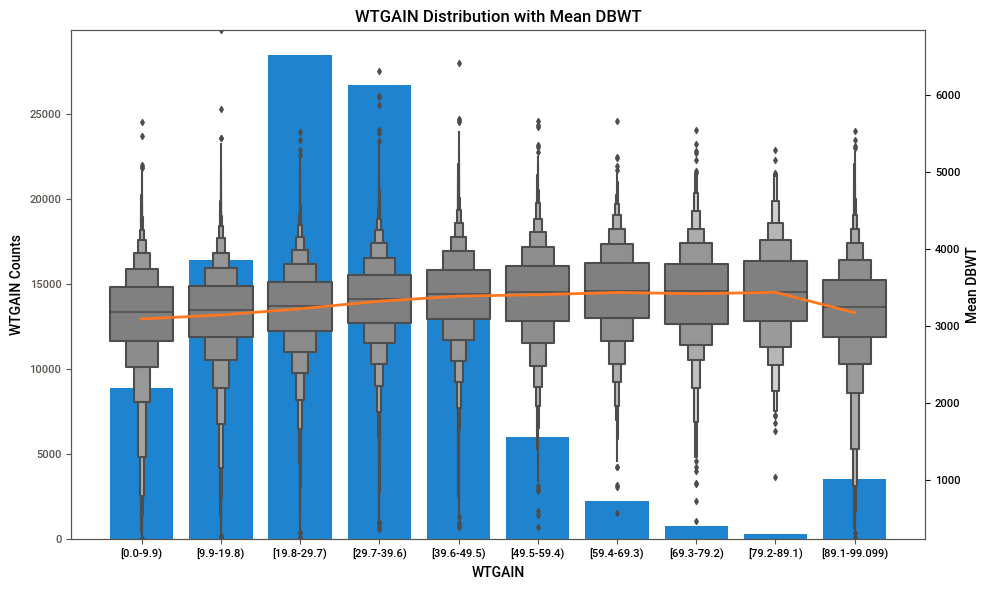

In [75]:
dual_line_bar_boxplot(train_analysis, 'DBWT', 'WTGAIN', chart="boxenplot")

## Conclusion

todo